**Importing Libraries**

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

**Data Preparation**

In [2]:

trainset = torchvision.datasets.MNIST(root = './data',train = True, download = True, transform = transforms.ToTensor())


In [3]:
trainloader = torch.utils.data.DataLoader(trainset,batch_size=64,shuffle=True)

**Model Development**

In [5]:
class GenBlock(nn.Module):
  def __init__(self,in_features,out_features):
    super(GenBlock,self).__init__()
    self.main = nn.Sequential(
        nn.Linear(in_features,out_features),
        nn.ReLU(True)
    )

  def forward(self,x):
    return self.main(x)


In [6]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator,self).__init__()
    self.main = nn.Sequential(
        GenBlock(100,256),
        GenBlock(256,512),
        GenBlock(512,1024),
        nn.Linear(1024,28*28),
        nn.Tanh()  #Transforming the values in the range of -1 and 1
    )

  def forward(self,input):
    return self.main(input).view(-1,1,28,28)


In [7]:
class DisBlock(nn.Module):
  def __init__(self,in_features,out_features):
    super(DisBlock,self).__init__()
    self.main = nn.Sequential(
        nn.Linear(in_features,out_features),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Dropout(0.2)
    )

  def forward(self,x):
    return self.main(x)

In [8]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            DisBlock(28*28, 1024),
            DisBlock(1024, 512),
            DisBlock(512, 256),
            nn.Linear(256, 1),  # Linear output without activation
        )

    def forward(self, input):
        return self.main(input.view(-1, 28*28))

**Initialization**

In [8]:
generator = Generator()
discriminator = Discriminator()

# Wasserstein Loss implementation
def discriminator_loss(real_output, fake_output):
    return -(torch.mean(real_output) - torch.mean(fake_output))

def generator_loss(fake_output):
    return -torch.mean(fake_output)

# Update Optimizers
OptimizerG = optim.RMSprop(generator.parameters(), lr=0.0002)
OptimizerD = optim.RMSprop(discriminator.parameters(), lr=0.0002)

**Training**

Epoch [0/80] Batch 0/938                   Loss D: -0.0006, Loss G: -0.0102
Epoch [0/80] Batch 100/938                   Loss D: -5.7080, Loss G: 0.1408
Epoch [0/80] Batch 200/938                   Loss D: -6.0833, Loss G: 1.7114
Epoch [0/80] Batch 300/938                   Loss D: -0.0666, Loss G: 0.0786
Epoch [0/80] Batch 400/938                   Loss D: -0.3079, Loss G: 0.4953
Epoch [0/80] Batch 500/938                   Loss D: 0.3580, Loss G: -0.1307
Epoch [0/80] Batch 600/938                   Loss D: 0.1490, Loss G: -0.2461
Epoch [0/80] Batch 700/938                   Loss D: 0.2276, Loss G: -0.8061
Epoch [0/80] Batch 800/938                   Loss D: -0.7309, Loss G: 1.0876
Epoch [0/80] Batch 900/938                   Loss D: -1.5406, Loss G: -0.8382


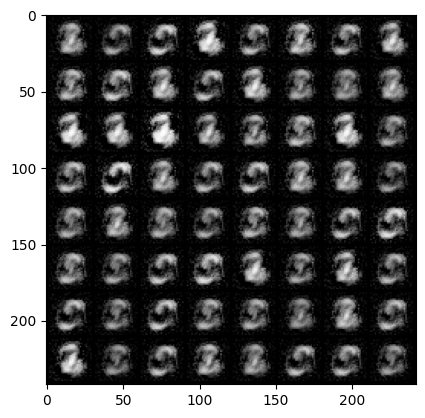

Epoch [1/80] Batch 0/938                   Loss D: 0.0021, Loss G: -2.1138
Epoch [1/80] Batch 100/938                   Loss D: -1.9666, Loss G: -0.2460
Epoch [1/80] Batch 200/938                   Loss D: -1.8103, Loss G: 0.5505
Epoch [1/80] Batch 300/938                   Loss D: 1.9261, Loss G: -2.2356
Epoch [1/80] Batch 400/938                   Loss D: 0.0613, Loss G: -0.2537
Epoch [1/80] Batch 500/938                   Loss D: -0.5221, Loss G: 0.7932
Epoch [1/80] Batch 600/938                   Loss D: -0.7033, Loss G: 0.9870
Epoch [1/80] Batch 700/938                   Loss D: -1.4259, Loss G: 0.0784
Epoch [1/80] Batch 800/938                   Loss D: -1.0281, Loss G: 2.0260
Epoch [1/80] Batch 900/938                   Loss D: -1.8675, Loss G: 0.9693


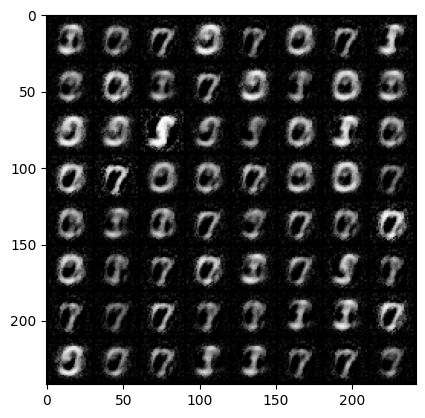

Epoch [2/80] Batch 0/938                   Loss D: -1.7170, Loss G: 1.1063
Epoch [2/80] Batch 100/938                   Loss D: -0.6990, Loss G: 0.5757
Epoch [2/80] Batch 200/938                   Loss D: -1.3805, Loss G: 0.2532
Epoch [2/80] Batch 300/938                   Loss D: -0.1570, Loss G: -0.1920
Epoch [2/80] Batch 400/938                   Loss D: -0.7591, Loss G: 0.2592
Epoch [2/80] Batch 500/938                   Loss D: -0.3081, Loss G: 0.3774
Epoch [2/80] Batch 600/938                   Loss D: -0.3514, Loss G: 0.4712
Epoch [2/80] Batch 700/938                   Loss D: 0.3099, Loss G: 0.1707
Epoch [2/80] Batch 800/938                   Loss D: -0.3966, Loss G: 0.5169
Epoch [2/80] Batch 900/938                   Loss D: -0.0778, Loss G: -0.0523


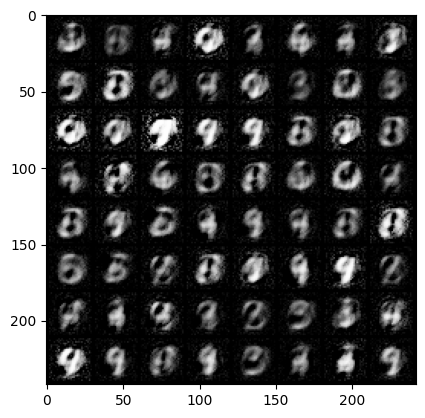

Epoch [3/80] Batch 0/938                   Loss D: -0.6260, Loss G: 1.0271
Epoch [3/80] Batch 100/938                   Loss D: -0.3667, Loss G: 0.8903
Epoch [3/80] Batch 200/938                   Loss D: -0.7871, Loss G: 0.1630
Epoch [3/80] Batch 300/938                   Loss D: -0.4423, Loss G: 0.1647
Epoch [3/80] Batch 400/938                   Loss D: -0.4725, Loss G: -0.1219
Epoch [3/80] Batch 500/938                   Loss D: -0.4584, Loss G: -0.3050
Epoch [3/80] Batch 600/938                   Loss D: -0.6187, Loss G: 0.1367
Epoch [3/80] Batch 700/938                   Loss D: -0.5449, Loss G: 0.0853
Epoch [3/80] Batch 800/938                   Loss D: -0.5255, Loss G: 0.5990
Epoch [3/80] Batch 900/938                   Loss D: -0.3345, Loss G: -0.2420


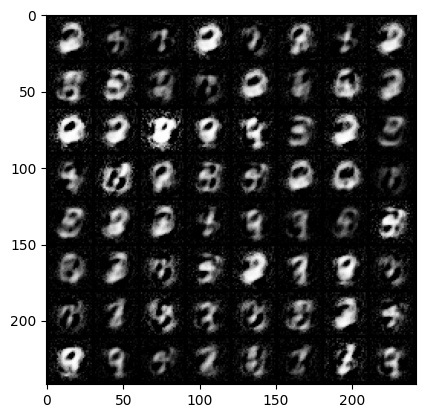

Epoch [4/80] Batch 0/938                   Loss D: -0.1121, Loss G: -0.4830
Epoch [4/80] Batch 100/938                   Loss D: -0.7759, Loss G: 0.5319
Epoch [4/80] Batch 200/938                   Loss D: -0.5596, Loss G: 0.6642
Epoch [4/80] Batch 300/938                   Loss D: -0.0603, Loss G: -0.0737
Epoch [4/80] Batch 400/938                   Loss D: -0.2850, Loss G: 0.3839
Epoch [4/80] Batch 500/938                   Loss D: -0.3190, Loss G: 0.7121
Epoch [4/80] Batch 600/938                   Loss D: -0.1776, Loss G: 0.2036
Epoch [4/80] Batch 700/938                   Loss D: -0.3135, Loss G: 0.0202
Epoch [4/80] Batch 800/938                   Loss D: -0.2871, Loss G: 0.7927
Epoch [4/80] Batch 900/938                   Loss D: -0.2271, Loss G: 0.1377


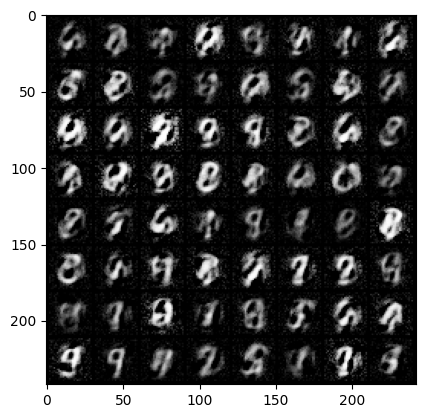

Epoch [5/80] Batch 0/938                   Loss D: -0.1682, Loss G: -0.4709
Epoch [5/80] Batch 100/938                   Loss D: -0.3578, Loss G: 0.0744
Epoch [5/80] Batch 200/938                   Loss D: -0.2397, Loss G: 0.0618
Epoch [5/80] Batch 300/938                   Loss D: -0.3806, Loss G: -0.0160
Epoch [5/80] Batch 400/938                   Loss D: -0.0689, Loss G: 0.0302
Epoch [5/80] Batch 500/938                   Loss D: -0.2478, Loss G: 0.3556
Epoch [5/80] Batch 600/938                   Loss D: -0.3202, Loss G: 0.7611
Epoch [5/80] Batch 700/938                   Loss D: -0.3197, Loss G: 0.6374
Epoch [5/80] Batch 800/938                   Loss D: -0.1165, Loss G: -0.7050
Epoch [5/80] Batch 900/938                   Loss D: -0.4154, Loss G: -0.5251


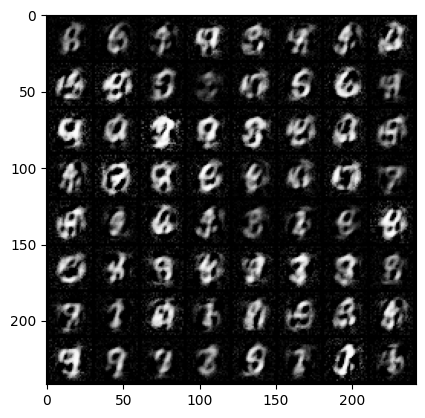

Epoch [6/80] Batch 0/938                   Loss D: -0.2644, Loss G: -0.2233
Epoch [6/80] Batch 100/938                   Loss D: -0.1579, Loss G: -0.2354
Epoch [6/80] Batch 200/938                   Loss D: -0.2986, Loss G: 0.2445
Epoch [6/80] Batch 300/938                   Loss D: -0.3437, Loss G: 0.1193
Epoch [6/80] Batch 400/938                   Loss D: -0.3419, Loss G: 0.1085
Epoch [6/80] Batch 500/938                   Loss D: -0.4854, Loss G: 0.1039
Epoch [6/80] Batch 600/938                   Loss D: -0.3336, Loss G: -0.3068
Epoch [6/80] Batch 700/938                   Loss D: -0.3682, Loss G: 0.8392
Epoch [6/80] Batch 800/938                   Loss D: -0.2853, Loss G: 0.6305
Epoch [6/80] Batch 900/938                   Loss D: -0.2505, Loss G: 0.4817


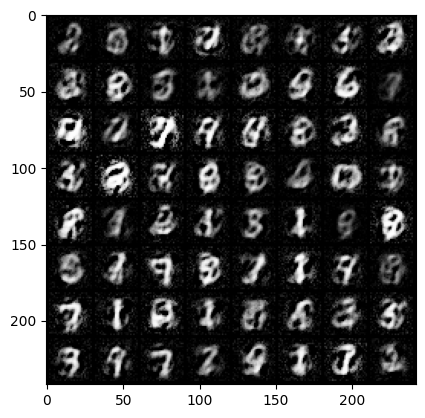

Epoch [7/80] Batch 0/938                   Loss D: 0.4780, Loss G: -0.8136
Epoch [7/80] Batch 100/938                   Loss D: -0.1652, Loss G: 0.2146
Epoch [7/80] Batch 200/938                   Loss D: -0.2154, Loss G: -0.0012
Epoch [7/80] Batch 300/938                   Loss D: -0.3530, Loss G: -0.1347
Epoch [7/80] Batch 400/938                   Loss D: -0.2477, Loss G: 0.1524
Epoch [7/80] Batch 500/938                   Loss D: -0.1988, Loss G: 1.0094
Epoch [7/80] Batch 600/938                   Loss D: -0.0709, Loss G: -0.1974
Epoch [7/80] Batch 700/938                   Loss D: -0.2395, Loss G: 0.6352
Epoch [7/80] Batch 800/938                   Loss D: -0.2072, Loss G: 0.6746
Epoch [7/80] Batch 900/938                   Loss D: -0.2277, Loss G: 0.4605


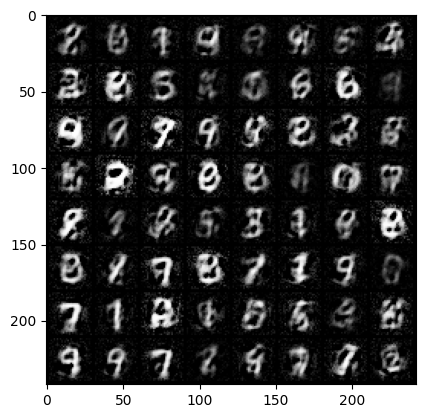

Epoch [8/80] Batch 0/938                   Loss D: -0.0911, Loss G: -0.1774
Epoch [8/80] Batch 100/938                   Loss D: -0.2449, Loss G: 0.7498
Epoch [8/80] Batch 200/938                   Loss D: -0.1045, Loss G: 0.0594
Epoch [8/80] Batch 300/938                   Loss D: -0.1781, Loss G: 0.2013
Epoch [8/80] Batch 400/938                   Loss D: -0.2656, Loss G: -0.1859
Epoch [8/80] Batch 500/938                   Loss D: -0.2680, Loss G: 0.7655
Epoch [8/80] Batch 600/938                   Loss D: -0.2141, Loss G: 0.5814
Epoch [8/80] Batch 700/938                   Loss D: -0.2882, Loss G: 0.6542
Epoch [8/80] Batch 800/938                   Loss D: -0.1171, Loss G: 0.8776
Epoch [8/80] Batch 900/938                   Loss D: -0.3908, Loss G: 0.9175


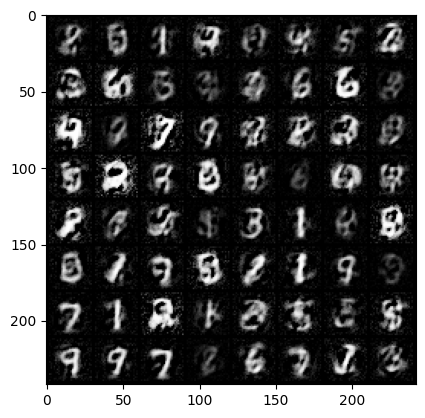

Epoch [9/80] Batch 0/938                   Loss D: -0.1584, Loss G: -0.6674
Epoch [9/80] Batch 100/938                   Loss D: -0.1647, Loss G: 0.1402
Epoch [9/80] Batch 200/938                   Loss D: 0.1077, Loss G: 0.5074
Epoch [9/80] Batch 300/938                   Loss D: -0.1349, Loss G: 0.6209
Epoch [9/80] Batch 400/938                   Loss D: -0.0955, Loss G: -0.3402
Epoch [9/80] Batch 500/938                   Loss D: -0.0859, Loss G: -0.4133
Epoch [9/80] Batch 600/938                   Loss D: -0.2860, Loss G: 0.6226
Epoch [9/80] Batch 700/938                   Loss D: -0.2822, Loss G: 0.0898
Epoch [9/80] Batch 800/938                   Loss D: -0.0855, Loss G: 0.1273
Epoch [9/80] Batch 900/938                   Loss D: -0.4224, Loss G: -0.7829


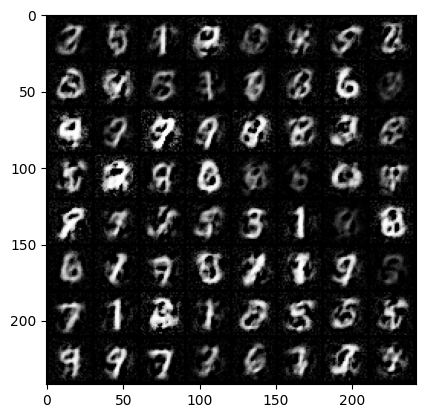

Epoch [10/80] Batch 0/938                   Loss D: -0.2276, Loss G: 0.4674
Epoch [10/80] Batch 100/938                   Loss D: -0.2150, Loss G: 0.9832
Epoch [10/80] Batch 200/938                   Loss D: -0.1296, Loss G: -0.2434
Epoch [10/80] Batch 300/938                   Loss D: -0.2017, Loss G: 0.3984
Epoch [10/80] Batch 400/938                   Loss D: -0.1756, Loss G: -0.0321
Epoch [10/80] Batch 500/938                   Loss D: -0.1776, Loss G: -0.4095
Epoch [10/80] Batch 600/938                   Loss D: -0.2147, Loss G: 0.6357
Epoch [10/80] Batch 700/938                   Loss D: -0.2412, Loss G: 0.1689
Epoch [10/80] Batch 800/938                   Loss D: -0.2387, Loss G: -0.5784
Epoch [10/80] Batch 900/938                   Loss D: -0.1941, Loss G: -0.0433


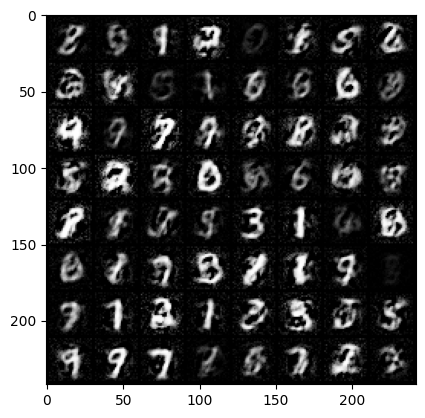

Epoch [11/80] Batch 0/938                   Loss D: -0.2010, Loss G: -0.2656
Epoch [11/80] Batch 100/938                   Loss D: -0.1607, Loss G: 0.0939
Epoch [11/80] Batch 200/938                   Loss D: -0.1455, Loss G: 0.5605
Epoch [11/80] Batch 300/938                   Loss D: 0.0250, Loss G: 0.3810
Epoch [11/80] Batch 400/938                   Loss D: -0.0007, Loss G: -0.0718
Epoch [11/80] Batch 500/938                   Loss D: -0.1775, Loss G: -0.0234
Epoch [11/80] Batch 600/938                   Loss D: -0.0512, Loss G: -0.4477
Epoch [11/80] Batch 700/938                   Loss D: -0.1735, Loss G: 0.1470
Epoch [11/80] Batch 800/938                   Loss D: -0.1583, Loss G: 0.2166
Epoch [11/80] Batch 900/938                   Loss D: -0.0551, Loss G: 0.5233


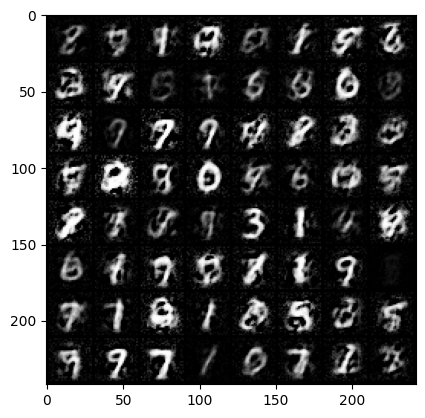

Epoch [12/80] Batch 0/938                   Loss D: -0.2038, Loss G: 0.1173
Epoch [12/80] Batch 100/938                   Loss D: -0.2356, Loss G: -0.2888
Epoch [12/80] Batch 200/938                   Loss D: -0.0901, Loss G: 0.4286
Epoch [12/80] Batch 300/938                   Loss D: -0.1694, Loss G: 0.0803
Epoch [12/80] Batch 400/938                   Loss D: -0.3132, Loss G: 0.1025
Epoch [12/80] Batch 500/938                   Loss D: -0.0276, Loss G: -0.3750
Epoch [12/80] Batch 600/938                   Loss D: -0.1565, Loss G: -0.5244
Epoch [12/80] Batch 700/938                   Loss D: -0.1385, Loss G: 0.1420
Epoch [12/80] Batch 800/938                   Loss D: -0.1240, Loss G: 0.5966
Epoch [12/80] Batch 900/938                   Loss D: -0.0332, Loss G: 0.0201


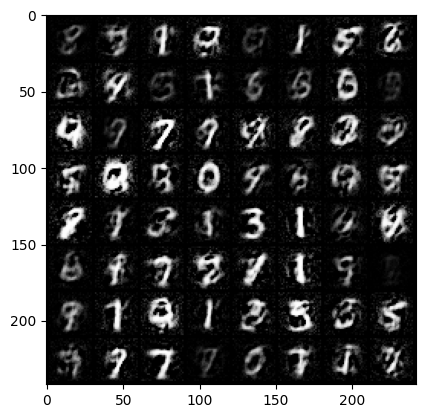

Epoch [13/80] Batch 0/938                   Loss D: 0.0038, Loss G: 0.3968
Epoch [13/80] Batch 100/938                   Loss D: -0.2854, Loss G: -0.2697
Epoch [13/80] Batch 200/938                   Loss D: 0.0039, Loss G: 0.2727
Epoch [13/80] Batch 300/938                   Loss D: 0.0044, Loss G: -0.3376
Epoch [13/80] Batch 400/938                   Loss D: -0.1113, Loss G: 0.5263
Epoch [13/80] Batch 500/938                   Loss D: 0.0242, Loss G: -0.3421
Epoch [13/80] Batch 600/938                   Loss D: -0.0552, Loss G: 0.0353
Epoch [13/80] Batch 700/938                   Loss D: -0.2594, Loss G: 0.5109
Epoch [13/80] Batch 800/938                   Loss D: 0.0002, Loss G: -0.0227
Epoch [13/80] Batch 900/938                   Loss D: -0.2202, Loss G: -0.3304


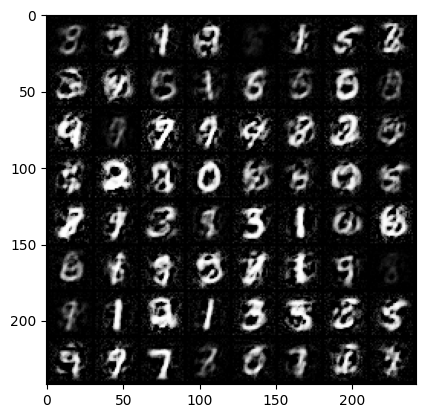

Epoch [14/80] Batch 0/938                   Loss D: -0.1931, Loss G: -0.7679
Epoch [14/80] Batch 100/938                   Loss D: -0.1105, Loss G: 0.1767
Epoch [14/80] Batch 200/938                   Loss D: -0.0222, Loss G: 0.5589
Epoch [14/80] Batch 300/938                   Loss D: -0.1634, Loss G: -0.2062
Epoch [14/80] Batch 400/938                   Loss D: -0.1323, Loss G: 0.4752
Epoch [14/80] Batch 500/938                   Loss D: 0.0498, Loss G: -0.1595
Epoch [14/80] Batch 600/938                   Loss D: -0.1213, Loss G: 0.2392
Epoch [14/80] Batch 700/938                   Loss D: -0.1518, Loss G: 0.5751
Epoch [14/80] Batch 800/938                   Loss D: -0.0767, Loss G: 0.2212
Epoch [14/80] Batch 900/938                   Loss D: -0.1946, Loss G: -0.0693


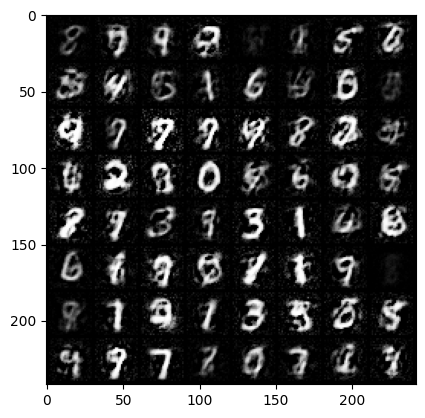

Epoch [15/80] Batch 0/938                   Loss D: -0.1667, Loss G: 0.0066
Epoch [15/80] Batch 100/938                   Loss D: -0.2156, Loss G: 0.5723
Epoch [15/80] Batch 200/938                   Loss D: -0.2090, Loss G: 0.3377
Epoch [15/80] Batch 300/938                   Loss D: -0.0877, Loss G: 0.7774
Epoch [15/80] Batch 400/938                   Loss D: -0.1731, Loss G: 1.1556
Epoch [15/80] Batch 500/938                   Loss D: -0.2216, Loss G: -0.5174
Epoch [15/80] Batch 600/938                   Loss D: -0.1787, Loss G: 0.1577
Epoch [15/80] Batch 700/938                   Loss D: -0.1398, Loss G: 0.0546
Epoch [15/80] Batch 800/938                   Loss D: -0.1500, Loss G: 0.3285
Epoch [15/80] Batch 900/938                   Loss D: -0.2310, Loss G: -0.1265


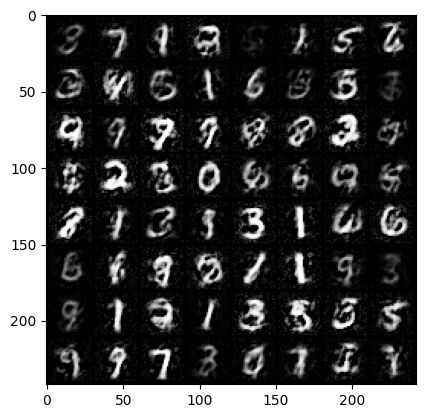

Epoch [16/80] Batch 0/938                   Loss D: 0.0118, Loss G: 0.2782
Epoch [16/80] Batch 100/938                   Loss D: -0.0831, Loss G: 0.2844
Epoch [16/80] Batch 200/938                   Loss D: -0.1229, Loss G: 0.1005
Epoch [16/80] Batch 300/938                   Loss D: -0.1368, Loss G: -0.7178
Epoch [16/80] Batch 400/938                   Loss D: -0.3078, Loss G: 0.6593
Epoch [16/80] Batch 500/938                   Loss D: -0.0828, Loss G: -0.1166
Epoch [16/80] Batch 600/938                   Loss D: -0.1296, Loss G: -0.2644
Epoch [16/80] Batch 700/938                   Loss D: -0.1682, Loss G: 0.6360
Epoch [16/80] Batch 800/938                   Loss D: -0.0886, Loss G: -0.3347
Epoch [16/80] Batch 900/938                   Loss D: -0.2004, Loss G: 0.3070


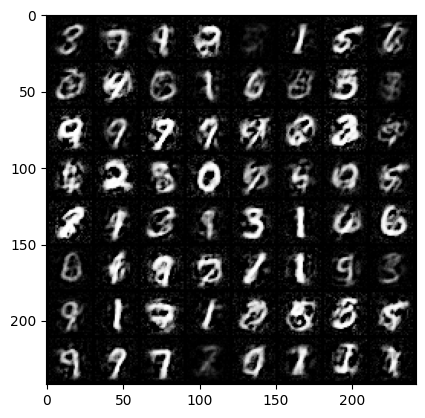

Epoch [17/80] Batch 0/938                   Loss D: -0.2520, Loss G: 0.9992
Epoch [17/80] Batch 100/938                   Loss D: -0.1590, Loss G: -0.1825
Epoch [17/80] Batch 200/938                   Loss D: -0.1740, Loss G: 0.2050
Epoch [17/80] Batch 300/938                   Loss D: -0.2342, Loss G: 0.7049
Epoch [17/80] Batch 400/938                   Loss D: -0.0488, Loss G: -0.0844
Epoch [17/80] Batch 500/938                   Loss D: -0.1501, Loss G: 1.0950
Epoch [17/80] Batch 600/938                   Loss D: -0.2067, Loss G: 0.0143
Epoch [17/80] Batch 700/938                   Loss D: -0.1675, Loss G: -0.3854
Epoch [17/80] Batch 800/938                   Loss D: -0.0712, Loss G: 0.3952
Epoch [17/80] Batch 900/938                   Loss D: -0.1719, Loss G: 0.1975


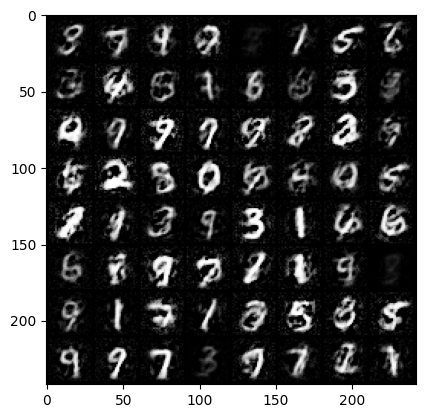

Epoch [18/80] Batch 0/938                   Loss D: 0.0016, Loss G: 0.0460
Epoch [18/80] Batch 100/938                   Loss D: -0.1548, Loss G: -0.0778
Epoch [18/80] Batch 200/938                   Loss D: -0.0742, Loss G: 0.0629
Epoch [18/80] Batch 300/938                   Loss D: -0.1366, Loss G: -0.7090
Epoch [18/80] Batch 400/938                   Loss D: -0.1572, Loss G: -0.1360
Epoch [18/80] Batch 500/938                   Loss D: -0.1883, Loss G: 0.6648
Epoch [18/80] Batch 600/938                   Loss D: -0.1815, Loss G: 0.2176
Epoch [18/80] Batch 700/938                   Loss D: 0.0057, Loss G: -0.2326
Epoch [18/80] Batch 800/938                   Loss D: -0.1780, Loss G: 0.2024
Epoch [18/80] Batch 900/938                   Loss D: -0.1319, Loss G: -0.5222


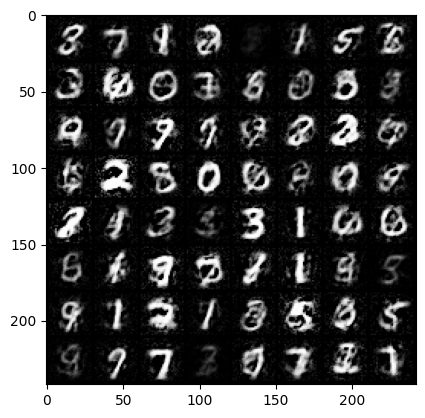

Epoch [19/80] Batch 0/938                   Loss D: -0.0510, Loss G: -0.5469
Epoch [19/80] Batch 100/938                   Loss D: -0.1292, Loss G: 0.7333
Epoch [19/80] Batch 200/938                   Loss D: -0.0395, Loss G: -0.0182
Epoch [19/80] Batch 300/938                   Loss D: -0.0496, Loss G: 0.5961
Epoch [19/80] Batch 400/938                   Loss D: -0.1671, Loss G: -0.7244
Epoch [19/80] Batch 500/938                   Loss D: -0.1376, Loss G: -0.6038
Epoch [19/80] Batch 600/938                   Loss D: -0.0619, Loss G: 0.5914
Epoch [19/80] Batch 700/938                   Loss D: -0.0118, Loss G: -0.3745
Epoch [19/80] Batch 800/938                   Loss D: -0.2077, Loss G: 0.4717
Epoch [19/80] Batch 900/938                   Loss D: -0.0003, Loss G: -0.5241


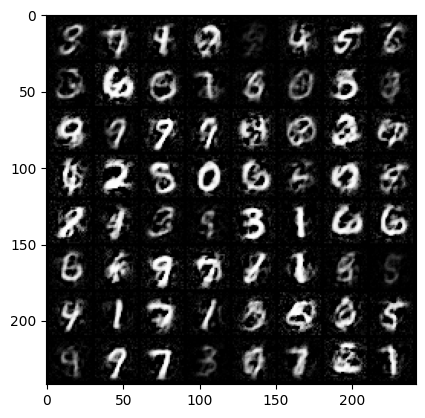

Epoch [20/80] Batch 0/938                   Loss D: -0.1046, Loss G: -0.5650
Epoch [20/80] Batch 100/938                   Loss D: -0.1705, Loss G: 0.6761
Epoch [20/80] Batch 200/938                   Loss D: 0.0868, Loss G: 0.4492
Epoch [20/80] Batch 300/938                   Loss D: -0.0408, Loss G: -0.4674
Epoch [20/80] Batch 400/938                   Loss D: -0.0440, Loss G: -0.8257
Epoch [20/80] Batch 500/938                   Loss D: -0.1362, Loss G: -0.1724
Epoch [20/80] Batch 600/938                   Loss D: -0.1372, Loss G: 0.0016
Epoch [20/80] Batch 700/938                   Loss D: -0.0796, Loss G: 0.1521
Epoch [20/80] Batch 800/938                   Loss D: -0.1192, Loss G: -0.9664
Epoch [20/80] Batch 900/938                   Loss D: -0.1253, Loss G: 0.5958


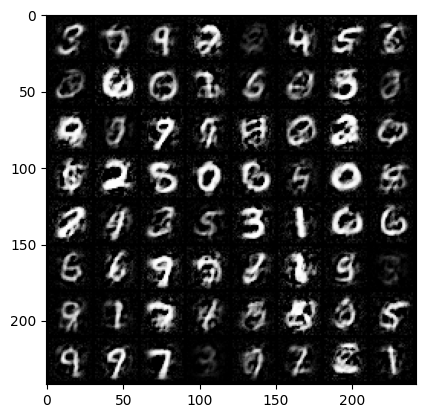

Epoch [21/80] Batch 0/938                   Loss D: -0.1507, Loss G: 0.5806
Epoch [21/80] Batch 100/938                   Loss D: -0.0285, Loss G: 0.2132
Epoch [21/80] Batch 200/938                   Loss D: -0.0403, Loss G: 0.3125
Epoch [21/80] Batch 300/938                   Loss D: 0.0015, Loss G: -0.4648
Epoch [21/80] Batch 400/938                   Loss D: 0.0023, Loss G: -0.0738
Epoch [21/80] Batch 500/938                   Loss D: -0.0465, Loss G: -0.6546
Epoch [21/80] Batch 600/938                   Loss D: -0.0345, Loss G: -0.0560
Epoch [21/80] Batch 700/938                   Loss D: -0.2217, Loss G: -0.4722
Epoch [21/80] Batch 800/938                   Loss D: -0.1592, Loss G: 0.6971
Epoch [21/80] Batch 900/938                   Loss D: -0.1180, Loss G: 0.0841


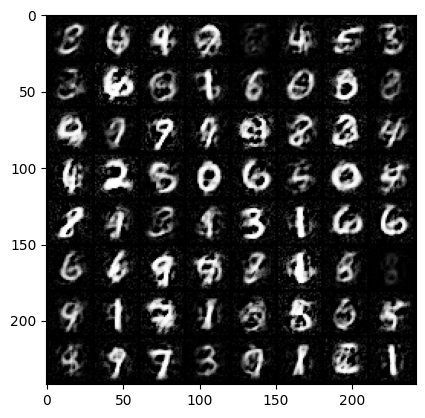

Epoch [22/80] Batch 0/938                   Loss D: 0.0235, Loss G: -0.3229
Epoch [22/80] Batch 100/938                   Loss D: 0.0165, Loss G: -0.5706
Epoch [22/80] Batch 200/938                   Loss D: -0.1505, Loss G: -0.1003
Epoch [22/80] Batch 300/938                   Loss D: -0.0626, Loss G: 0.4617
Epoch [22/80] Batch 400/938                   Loss D: 0.0485, Loss G: 0.1326
Epoch [22/80] Batch 500/938                   Loss D: -0.1734, Loss G: 1.0526
Epoch [22/80] Batch 600/938                   Loss D: -0.0239, Loss G: -0.5860
Epoch [22/80] Batch 700/938                   Loss D: -0.0200, Loss G: 0.3789
Epoch [22/80] Batch 800/938                   Loss D: -0.0826, Loss G: 0.2459
Epoch [22/80] Batch 900/938                   Loss D: -0.0924, Loss G: -0.3626


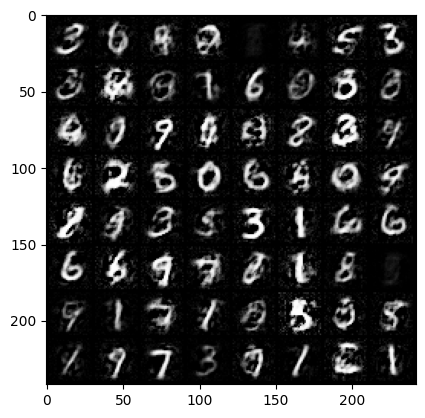

Epoch [23/80] Batch 0/938                   Loss D: -0.0377, Loss G: -0.3012
Epoch [23/80] Batch 100/938                   Loss D: 0.0424, Loss G: -0.0611
Epoch [23/80] Batch 200/938                   Loss D: -0.0754, Loss G: -0.0826
Epoch [23/80] Batch 300/938                   Loss D: -0.0467, Loss G: -0.3147
Epoch [23/80] Batch 400/938                   Loss D: 0.0512, Loss G: 0.5058
Epoch [23/80] Batch 500/938                   Loss D: 0.0173, Loss G: 0.6625
Epoch [23/80] Batch 600/938                   Loss D: -0.0128, Loss G: 0.2747
Epoch [23/80] Batch 700/938                   Loss D: -0.0218, Loss G: -0.0812
Epoch [23/80] Batch 800/938                   Loss D: -0.0822, Loss G: 0.2645
Epoch [23/80] Batch 900/938                   Loss D: -0.3303, Loss G: -0.0559


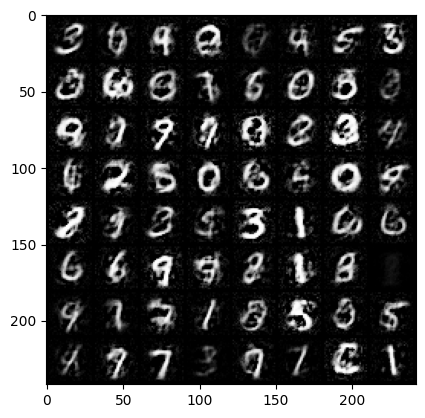

Epoch [24/80] Batch 0/938                   Loss D: -0.2524, Loss G: -0.0115
Epoch [24/80] Batch 100/938                   Loss D: -0.1079, Loss G: -0.0855
Epoch [24/80] Batch 200/938                   Loss D: -0.0828, Loss G: 0.5201
Epoch [24/80] Batch 300/938                   Loss D: -0.1361, Loss G: 0.2579
Epoch [24/80] Batch 400/938                   Loss D: 0.0837, Loss G: -0.6451
Epoch [24/80] Batch 500/938                   Loss D: -0.0925, Loss G: 0.2097
Epoch [24/80] Batch 600/938                   Loss D: -0.0706, Loss G: 0.5216
Epoch [24/80] Batch 700/938                   Loss D: 0.0938, Loss G: 0.1287
Epoch [24/80] Batch 800/938                   Loss D: -0.1364, Loss G: 0.1244
Epoch [24/80] Batch 900/938                   Loss D: -0.0548, Loss G: 0.2575


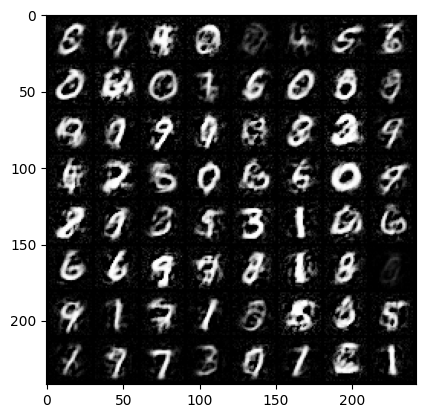

Epoch [25/80] Batch 0/938                   Loss D: 0.0578, Loss G: -0.5030
Epoch [25/80] Batch 100/938                   Loss D: -0.1080, Loss G: 0.6619
Epoch [25/80] Batch 200/938                   Loss D: 0.0358, Loss G: 0.4469
Epoch [25/80] Batch 300/938                   Loss D: 0.0353, Loss G: 0.0083
Epoch [25/80] Batch 400/938                   Loss D: -0.0568, Loss G: 0.2097
Epoch [25/80] Batch 500/938                   Loss D: -0.1070, Loss G: -0.0979
Epoch [25/80] Batch 600/938                   Loss D: -0.1175, Loss G: 0.2875
Epoch [25/80] Batch 700/938                   Loss D: 0.0263, Loss G: -0.2202
Epoch [25/80] Batch 800/938                   Loss D: -0.1618, Loss G: 0.0684
Epoch [25/80] Batch 900/938                   Loss D: 0.0492, Loss G: 0.0916


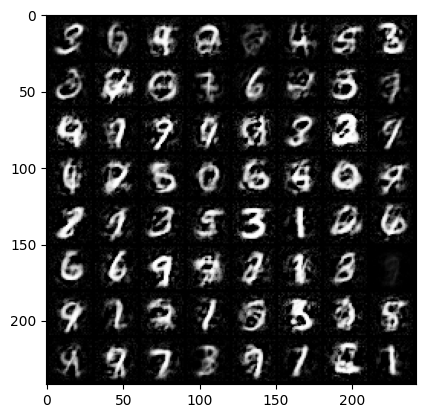

Epoch [26/80] Batch 0/938                   Loss D: 0.0856, Loss G: 0.0782
Epoch [26/80] Batch 100/938                   Loss D: -0.1108, Loss G: 0.4721
Epoch [26/80] Batch 200/938                   Loss D: 0.0118, Loss G: -0.0121
Epoch [26/80] Batch 300/938                   Loss D: -0.0853, Loss G: 0.3439
Epoch [26/80] Batch 400/938                   Loss D: -0.1110, Loss G: -0.3894
Epoch [26/80] Batch 500/938                   Loss D: -0.0957, Loss G: -0.2355
Epoch [26/80] Batch 600/938                   Loss D: -0.0019, Loss G: -0.2980
Epoch [26/80] Batch 700/938                   Loss D: -0.1549, Loss G: 0.5126
Epoch [26/80] Batch 800/938                   Loss D: -0.0725, Loss G: 0.2400
Epoch [26/80] Batch 900/938                   Loss D: -0.0225, Loss G: 0.0934


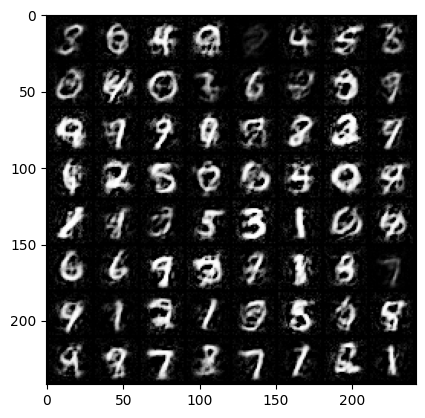

Epoch [27/80] Batch 0/938                   Loss D: -0.0001, Loss G: -0.0196
Epoch [27/80] Batch 100/938                   Loss D: -0.0380, Loss G: 0.0146
Epoch [27/80] Batch 200/938                   Loss D: -0.1135, Loss G: 0.1526
Epoch [27/80] Batch 300/938                   Loss D: -0.0678, Loss G: 0.1536
Epoch [27/80] Batch 400/938                   Loss D: -0.0007, Loss G: -0.0040
Epoch [27/80] Batch 500/938                   Loss D: 0.0498, Loss G: 0.1482
Epoch [27/80] Batch 600/938                   Loss D: 0.0080, Loss G: 0.1113
Epoch [27/80] Batch 700/938                   Loss D: -0.1230, Loss G: 0.2365
Epoch [27/80] Batch 800/938                   Loss D: -0.0563, Loss G: 0.3222
Epoch [27/80] Batch 900/938                   Loss D: 0.0774, Loss G: -0.1659


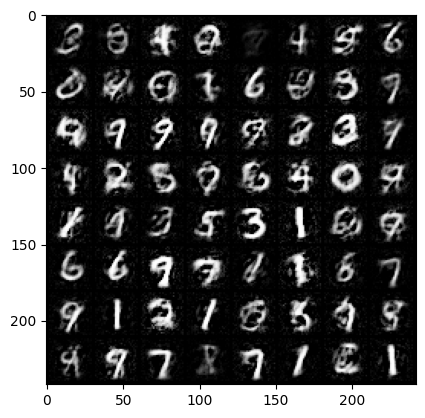

Epoch [28/80] Batch 0/938                   Loss D: -0.1720, Loss G: -0.4452
Epoch [28/80] Batch 100/938                   Loss D: -0.1035, Loss G: -0.0374
Epoch [28/80] Batch 200/938                   Loss D: -0.0864, Loss G: 0.2071
Epoch [28/80] Batch 300/938                   Loss D: -0.1300, Loss G: 0.0204
Epoch [28/80] Batch 400/938                   Loss D: -0.0880, Loss G: 0.3519
Epoch [28/80] Batch 500/938                   Loss D: -0.0115, Loss G: 0.0862
Epoch [28/80] Batch 600/938                   Loss D: -0.0243, Loss G: 0.3379
Epoch [28/80] Batch 700/938                   Loss D: -0.0100, Loss G: -0.0972
Epoch [28/80] Batch 800/938                   Loss D: -0.1890, Loss G: 0.2732
Epoch [28/80] Batch 900/938                   Loss D: -0.0493, Loss G: 0.1558


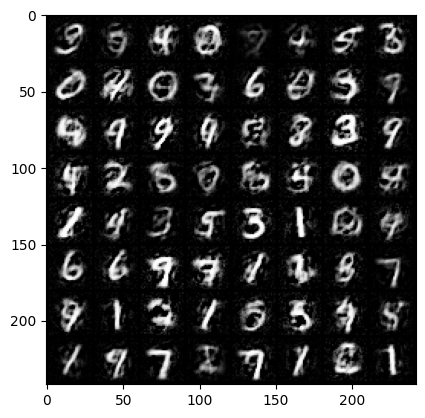

Epoch [29/80] Batch 0/938                   Loss D: 0.0452, Loss G: 0.0661
Epoch [29/80] Batch 100/938                   Loss D: 0.0233, Loss G: -0.2414
Epoch [29/80] Batch 200/938                   Loss D: 0.1051, Loss G: 0.0278
Epoch [29/80] Batch 300/938                   Loss D: -0.1339, Loss G: 0.0783
Epoch [29/80] Batch 400/938                   Loss D: 0.0795, Loss G: 0.4439
Epoch [29/80] Batch 500/938                   Loss D: 0.0210, Loss G: -0.0988
Epoch [29/80] Batch 600/938                   Loss D: -0.0292, Loss G: -0.0183
Epoch [29/80] Batch 700/938                   Loss D: 0.1104, Loss G: 0.2411
Epoch [29/80] Batch 800/938                   Loss D: -0.1246, Loss G: -0.0945
Epoch [29/80] Batch 900/938                   Loss D: -0.0395, Loss G: 0.1718


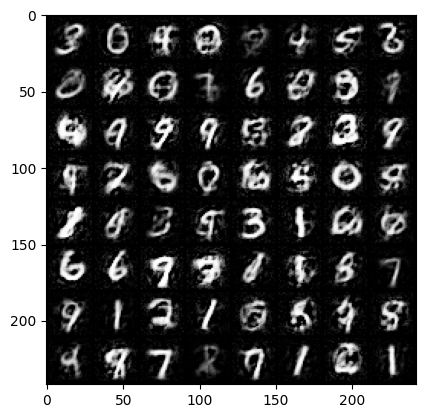

Epoch [30/80] Batch 0/938                   Loss D: 0.0768, Loss G: 0.1775
Epoch [30/80] Batch 100/938                   Loss D: -0.0747, Loss G: 0.2660
Epoch [30/80] Batch 200/938                   Loss D: -0.0289, Loss G: -0.4217
Epoch [30/80] Batch 300/938                   Loss D: -0.0365, Loss G: -0.5283
Epoch [30/80] Batch 400/938                   Loss D: 0.0290, Loss G: 0.4914
Epoch [30/80] Batch 500/938                   Loss D: -0.0644, Loss G: 0.1427
Epoch [30/80] Batch 600/938                   Loss D: 0.0585, Loss G: -0.3861
Epoch [30/80] Batch 700/938                   Loss D: -0.0208, Loss G: 0.1368
Epoch [30/80] Batch 800/938                   Loss D: -0.1192, Loss G: 0.0320
Epoch [30/80] Batch 900/938                   Loss D: -0.2051, Loss G: 0.6463


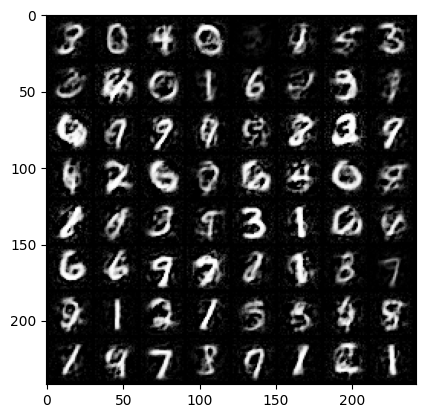

Epoch [31/80] Batch 0/938                   Loss D: -0.1436, Loss G: 0.4235
Epoch [31/80] Batch 100/938                   Loss D: -0.0740, Loss G: 0.3128
Epoch [31/80] Batch 200/938                   Loss D: 0.0023, Loss G: -0.0467
Epoch [31/80] Batch 300/938                   Loss D: -0.0133, Loss G: -0.0197
Epoch [31/80] Batch 400/938                   Loss D: -0.0098, Loss G: -0.1169
Epoch [31/80] Batch 500/938                   Loss D: -0.1331, Loss G: 0.4684
Epoch [31/80] Batch 600/938                   Loss D: 0.1240, Loss G: -0.1284
Epoch [31/80] Batch 700/938                   Loss D: -0.0744, Loss G: 0.2258
Epoch [31/80] Batch 800/938                   Loss D: -0.0033, Loss G: -0.1729
Epoch [31/80] Batch 900/938                   Loss D: -0.0659, Loss G: 0.5739


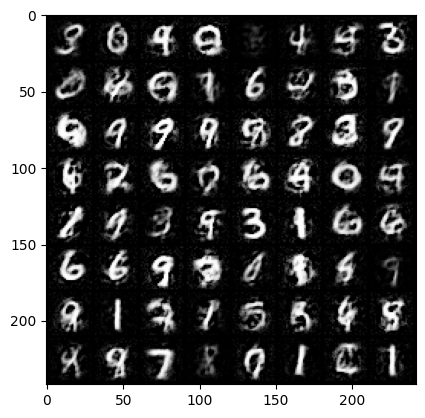

Epoch [32/80] Batch 0/938                   Loss D: -0.0877, Loss G: 0.0487
Epoch [32/80] Batch 100/938                   Loss D: -0.0571, Loss G: -0.2242
Epoch [32/80] Batch 200/938                   Loss D: -0.0127, Loss G: 0.1865
Epoch [32/80] Batch 300/938                   Loss D: -0.0924, Loss G: 0.2331
Epoch [32/80] Batch 400/938                   Loss D: -0.0808, Loss G: 0.3870
Epoch [32/80] Batch 500/938                   Loss D: 0.0287, Loss G: -0.7599
Epoch [32/80] Batch 600/938                   Loss D: 0.1683, Loss G: 0.2126
Epoch [32/80] Batch 700/938                   Loss D: 0.0246, Loss G: -0.1486
Epoch [32/80] Batch 800/938                   Loss D: -0.1090, Loss G: -0.1084
Epoch [32/80] Batch 900/938                   Loss D: -0.0497, Loss G: 0.1881


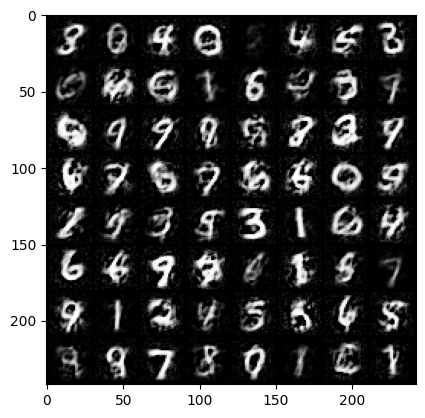

Epoch [33/80] Batch 0/938                   Loss D: -0.0988, Loss G: 0.3276
Epoch [33/80] Batch 100/938                   Loss D: -0.0575, Loss G: 0.1311
Epoch [33/80] Batch 200/938                   Loss D: -0.0078, Loss G: 0.1444
Epoch [33/80] Batch 300/938                   Loss D: 0.0054, Loss G: -0.0886
Epoch [33/80] Batch 400/938                   Loss D: -0.0904, Loss G: 0.4245
Epoch [33/80] Batch 500/938                   Loss D: -0.0176, Loss G: 0.1378
Epoch [33/80] Batch 600/938                   Loss D: -0.1597, Loss G: 0.8817
Epoch [33/80] Batch 700/938                   Loss D: -0.1571, Loss G: 0.5272
Epoch [33/80] Batch 800/938                   Loss D: 0.0111, Loss G: -0.4004
Epoch [33/80] Batch 900/938                   Loss D: -0.1548, Loss G: 0.9245


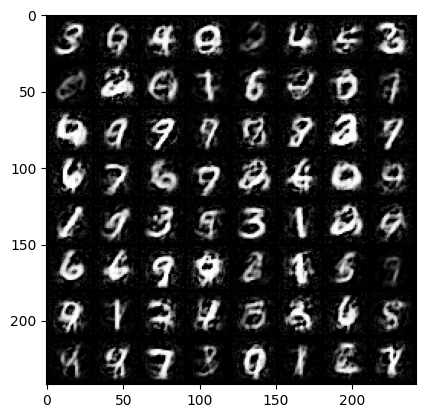

Epoch [34/80] Batch 0/938                   Loss D: -0.0912, Loss G: -0.4822
Epoch [34/80] Batch 100/938                   Loss D: 0.0315, Loss G: -0.1497
Epoch [34/80] Batch 200/938                   Loss D: 0.0003, Loss G: 0.0243
Epoch [34/80] Batch 300/938                   Loss D: 0.0781, Loss G: -0.5121
Epoch [34/80] Batch 400/938                   Loss D: -0.0377, Loss G: 0.1776
Epoch [34/80] Batch 500/938                   Loss D: -0.1769, Loss G: -0.1023
Epoch [34/80] Batch 600/938                   Loss D: -0.0035, Loss G: -0.0462
Epoch [34/80] Batch 700/938                   Loss D: -0.0672, Loss G: 0.2876
Epoch [34/80] Batch 800/938                   Loss D: -0.0909, Loss G: 0.0637
Epoch [34/80] Batch 900/938                   Loss D: -0.0770, Loss G: 0.2863


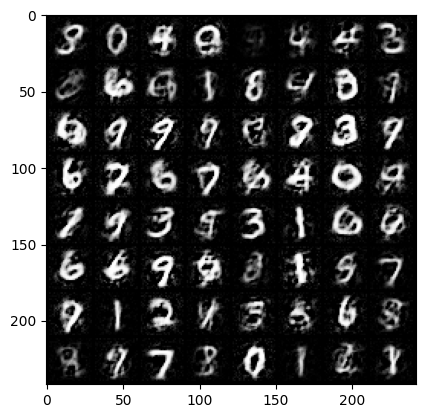

Epoch [35/80] Batch 0/938                   Loss D: 0.0592, Loss G: -0.2527
Epoch [35/80] Batch 100/938                   Loss D: 0.0085, Loss G: 0.1460
Epoch [35/80] Batch 200/938                   Loss D: -0.0692, Loss G: 0.5556
Epoch [35/80] Batch 300/938                   Loss D: -0.1015, Loss G: -0.0059
Epoch [35/80] Batch 400/938                   Loss D: -0.0220, Loss G: -0.1761
Epoch [35/80] Batch 500/938                   Loss D: 0.0495, Loss G: 0.3988
Epoch [35/80] Batch 600/938                   Loss D: 0.0862, Loss G: -0.1944
Epoch [35/80] Batch 700/938                   Loss D: -0.0692, Loss G: 0.6732
Epoch [35/80] Batch 800/938                   Loss D: -0.0650, Loss G: -0.3940
Epoch [35/80] Batch 900/938                   Loss D: 0.0042, Loss G: 0.1071


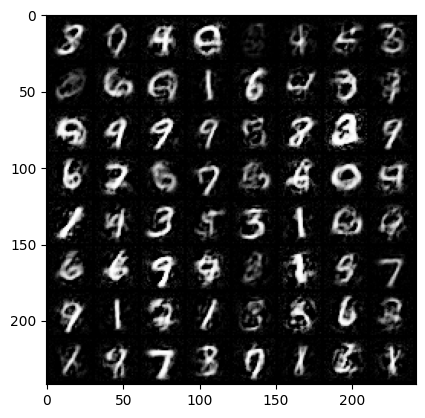

Epoch [36/80] Batch 0/938                   Loss D: -0.0360, Loss G: -0.2062
Epoch [36/80] Batch 100/938                   Loss D: 0.0068, Loss G: 0.3910
Epoch [36/80] Batch 200/938                   Loss D: -0.1275, Loss G: 0.2041
Epoch [36/80] Batch 300/938                   Loss D: 0.0297, Loss G: -0.5186
Epoch [36/80] Batch 400/938                   Loss D: 0.0169, Loss G: 0.2268
Epoch [36/80] Batch 500/938                   Loss D: -0.1154, Loss G: 0.2161
Epoch [36/80] Batch 600/938                   Loss D: 0.0672, Loss G: -0.4544
Epoch [36/80] Batch 700/938                   Loss D: 0.0329, Loss G: 0.5108
Epoch [36/80] Batch 800/938                   Loss D: 0.0009, Loss G: 0.1437
Epoch [36/80] Batch 900/938                   Loss D: -0.0458, Loss G: 0.3473


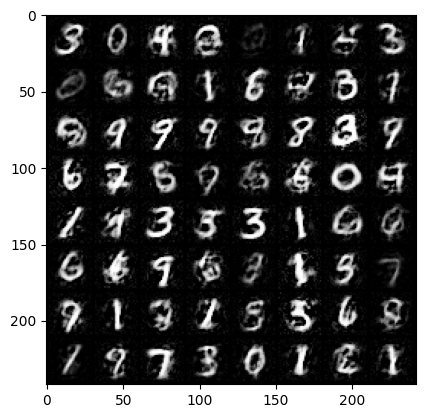

Epoch [37/80] Batch 0/938                   Loss D: 0.0292, Loss G: 0.3848
Epoch [37/80] Batch 100/938                   Loss D: 0.0638, Loss G: -0.6213
Epoch [37/80] Batch 200/938                   Loss D: -0.0527, Loss G: 0.3695
Epoch [37/80] Batch 300/938                   Loss D: 0.0478, Loss G: -0.1864
Epoch [37/80] Batch 400/938                   Loss D: -0.0730, Loss G: -0.1588
Epoch [37/80] Batch 500/938                   Loss D: -0.0068, Loss G: 0.3044
Epoch [37/80] Batch 600/938                   Loss D: -0.0776, Loss G: -0.1630
Epoch [37/80] Batch 700/938                   Loss D: -0.1445, Loss G: 0.1653
Epoch [37/80] Batch 800/938                   Loss D: -0.1095, Loss G: 0.5434
Epoch [37/80] Batch 900/938                   Loss D: -0.0394, Loss G: -0.2076


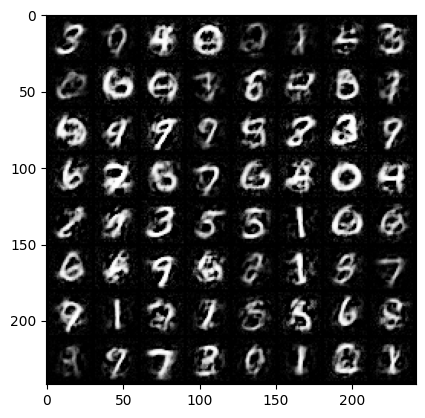

Epoch [38/80] Batch 0/938                   Loss D: 0.0974, Loss G: -0.1740
Epoch [38/80] Batch 100/938                   Loss D: 0.0555, Loss G: -0.2788
Epoch [38/80] Batch 200/938                   Loss D: -0.1381, Loss G: 0.4787
Epoch [38/80] Batch 300/938                   Loss D: 0.0702, Loss G: -0.4440
Epoch [38/80] Batch 400/938                   Loss D: -0.0129, Loss G: 0.4403
Epoch [38/80] Batch 500/938                   Loss D: 0.0011, Loss G: -0.1097
Epoch [38/80] Batch 600/938                   Loss D: 0.0102, Loss G: -0.0057
Epoch [38/80] Batch 700/938                   Loss D: 0.0359, Loss G: -0.0201
Epoch [38/80] Batch 800/938                   Loss D: 0.0132, Loss G: -0.5196
Epoch [38/80] Batch 900/938                   Loss D: -0.0938, Loss G: 0.4067


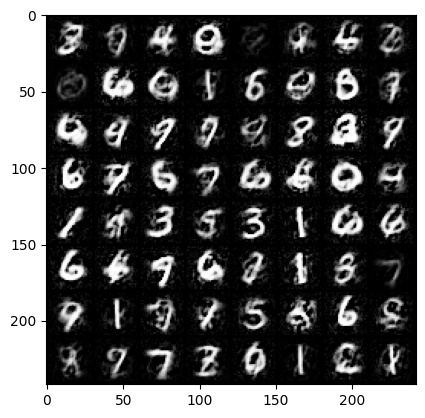

Epoch [39/80] Batch 0/938                   Loss D: 0.0399, Loss G: -0.4256
Epoch [39/80] Batch 100/938                   Loss D: -0.1553, Loss G: 0.7256
Epoch [39/80] Batch 200/938                   Loss D: -0.0299, Loss G: -0.2796
Epoch [39/80] Batch 300/938                   Loss D: 0.0374, Loss G: -0.1291
Epoch [39/80] Batch 400/938                   Loss D: -0.0882, Loss G: 0.0797
Epoch [39/80] Batch 500/938                   Loss D: -0.1550, Loss G: 0.2927
Epoch [39/80] Batch 600/938                   Loss D: -0.1019, Loss G: 0.4996
Epoch [39/80] Batch 700/938                   Loss D: 0.0675, Loss G: -0.1271
Epoch [39/80] Batch 800/938                   Loss D: 0.0260, Loss G: 0.0090
Epoch [39/80] Batch 900/938                   Loss D: 0.0500, Loss G: 0.3996


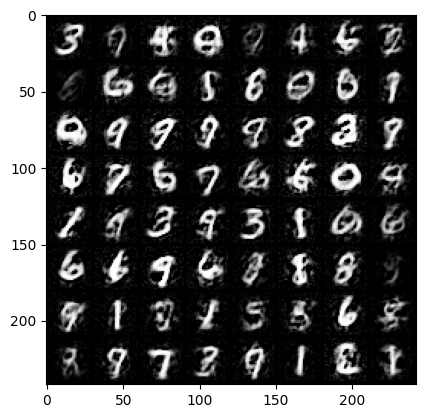

Epoch [40/80] Batch 0/938                   Loss D: 0.0060, Loss G: -0.5185
Epoch [40/80] Batch 100/938                   Loss D: -0.0294, Loss G: 0.1966
Epoch [40/80] Batch 200/938                   Loss D: -0.0455, Loss G: -0.0525
Epoch [40/80] Batch 300/938                   Loss D: 0.0526, Loss G: -0.3759
Epoch [40/80] Batch 400/938                   Loss D: -0.0656, Loss G: 0.5283
Epoch [40/80] Batch 500/938                   Loss D: 0.0025, Loss G: -0.1503
Epoch [40/80] Batch 600/938                   Loss D: 0.0447, Loss G: 0.2811
Epoch [40/80] Batch 700/938                   Loss D: -0.0099, Loss G: -0.4199
Epoch [40/80] Batch 800/938                   Loss D: 0.0122, Loss G: 0.1866
Epoch [40/80] Batch 900/938                   Loss D: -0.0599, Loss G: 0.6081


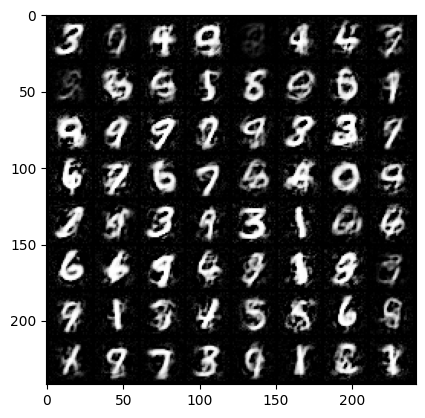

Epoch [41/80] Batch 0/938                   Loss D: 0.0438, Loss G: -0.0006
Epoch [41/80] Batch 100/938                   Loss D: 0.0140, Loss G: 0.4694
Epoch [41/80] Batch 200/938                   Loss D: -0.1281, Loss G: 0.3487
Epoch [41/80] Batch 300/938                   Loss D: -0.0691, Loss G: -0.0230
Epoch [41/80] Batch 400/938                   Loss D: -0.0989, Loss G: 0.3110
Epoch [41/80] Batch 500/938                   Loss D: -0.0693, Loss G: 0.1580
Epoch [41/80] Batch 600/938                   Loss D: 0.0011, Loss G: -0.2240
Epoch [41/80] Batch 700/938                   Loss D: -0.0263, Loss G: 0.3149
Epoch [41/80] Batch 800/938                   Loss D: 0.0171, Loss G: -0.1837
Epoch [41/80] Batch 900/938                   Loss D: -0.0029, Loss G: -0.1419


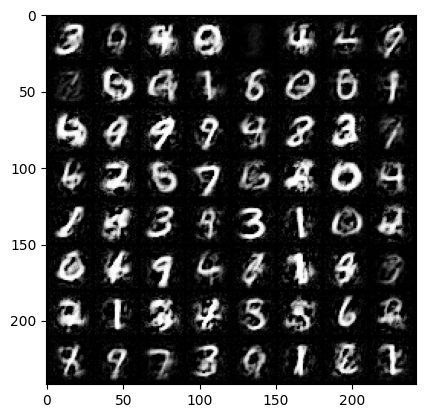

Epoch [42/80] Batch 0/938                   Loss D: 0.0207, Loss G: -0.1326
Epoch [42/80] Batch 100/938                   Loss D: 0.0077, Loss G: -0.3436
Epoch [42/80] Batch 200/938                   Loss D: -0.0605, Loss G: 0.0817
Epoch [42/80] Batch 300/938                   Loss D: 0.0550, Loss G: 0.2277
Epoch [42/80] Batch 400/938                   Loss D: 0.0299, Loss G: 0.0654
Epoch [42/80] Batch 500/938                   Loss D: -0.0052, Loss G: 0.1355
Epoch [42/80] Batch 600/938                   Loss D: 0.0294, Loss G: -0.3529
Epoch [42/80] Batch 700/938                   Loss D: -0.0206, Loss G: 0.2566
Epoch [42/80] Batch 800/938                   Loss D: -0.1425, Loss G: 0.2230
Epoch [42/80] Batch 900/938                   Loss D: -0.0047, Loss G: 0.1801


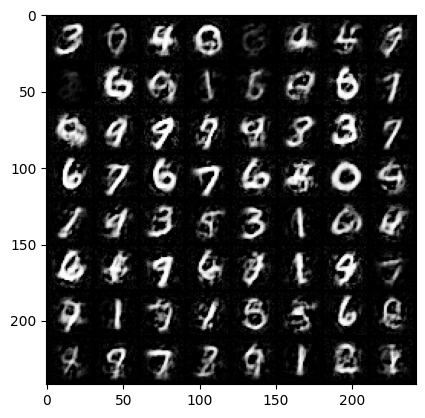

Epoch [43/80] Batch 0/938                   Loss D: 0.0473, Loss G: -0.2266
Epoch [43/80] Batch 100/938                   Loss D: -0.0375, Loss G: -0.0163
Epoch [43/80] Batch 200/938                   Loss D: 0.0391, Loss G: -0.2541
Epoch [43/80] Batch 300/938                   Loss D: -0.0685, Loss G: 0.2076
Epoch [43/80] Batch 400/938                   Loss D: 0.0573, Loss G: -0.0515
Epoch [43/80] Batch 500/938                   Loss D: -0.0852, Loss G: -0.2560
Epoch [43/80] Batch 600/938                   Loss D: -0.0658, Loss G: -0.1020
Epoch [43/80] Batch 700/938                   Loss D: -0.0489, Loss G: 0.3487
Epoch [43/80] Batch 800/938                   Loss D: -0.0506, Loss G: -0.1933
Epoch [43/80] Batch 900/938                   Loss D: 0.0006, Loss G: -0.0866


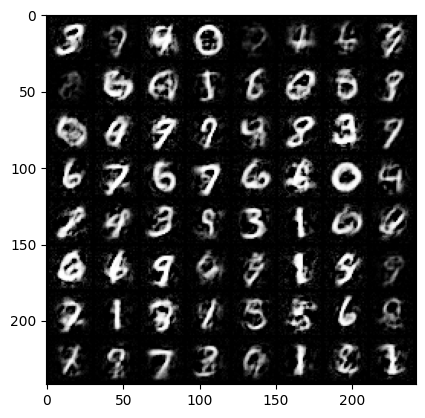

Epoch [44/80] Batch 0/938                   Loss D: -0.1198, Loss G: 0.3982
Epoch [44/80] Batch 100/938                   Loss D: 0.0536, Loss G: 0.2172
Epoch [44/80] Batch 200/938                   Loss D: -0.0288, Loss G: -0.2685
Epoch [44/80] Batch 300/938                   Loss D: -0.0246, Loss G: 0.2396
Epoch [44/80] Batch 400/938                   Loss D: -0.1350, Loss G: 0.1246
Epoch [44/80] Batch 500/938                   Loss D: -0.0327, Loss G: 0.0946
Epoch [44/80] Batch 600/938                   Loss D: 0.0661, Loss G: -0.1789
Epoch [44/80] Batch 700/938                   Loss D: -0.0662, Loss G: 0.0023
Epoch [44/80] Batch 800/938                   Loss D: -0.0082, Loss G: -0.1659
Epoch [44/80] Batch 900/938                   Loss D: -0.0002, Loss G: -0.0368


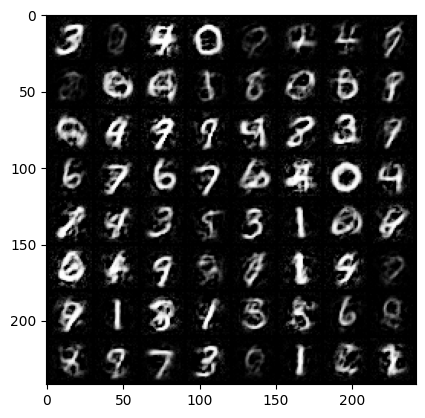

Epoch [45/80] Batch 0/938                   Loss D: -0.0625, Loss G: -0.0124
Epoch [45/80] Batch 100/938                   Loss D: -0.0722, Loss G: 0.4390
Epoch [45/80] Batch 200/938                   Loss D: 0.0421, Loss G: -0.0250
Epoch [45/80] Batch 300/938                   Loss D: -0.0101, Loss G: -0.3087
Epoch [45/80] Batch 400/938                   Loss D: -0.0090, Loss G: -0.3423
Epoch [45/80] Batch 500/938                   Loss D: -0.0322, Loss G: 0.1452
Epoch [45/80] Batch 600/938                   Loss D: 0.0565, Loss G: -0.1914
Epoch [45/80] Batch 700/938                   Loss D: 0.0218, Loss G: -0.1376
Epoch [45/80] Batch 800/938                   Loss D: -0.0261, Loss G: 0.2074
Epoch [45/80] Batch 900/938                   Loss D: -0.0231, Loss G: -0.0444


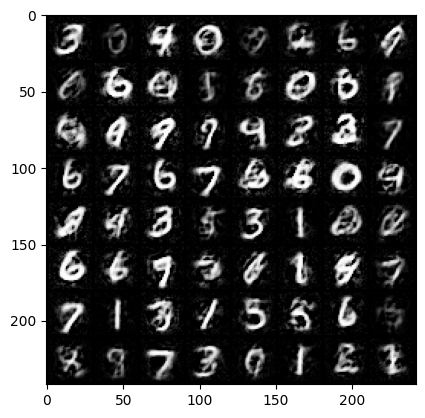

Epoch [46/80] Batch 0/938                   Loss D: 0.1023, Loss G: 0.0490
Epoch [46/80] Batch 100/938                   Loss D: 0.0238, Loss G: 0.0096
Epoch [46/80] Batch 200/938                   Loss D: -0.0203, Loss G: 0.0722
Epoch [46/80] Batch 300/938                   Loss D: 0.1168, Loss G: -0.0619
Epoch [46/80] Batch 400/938                   Loss D: -0.1126, Loss G: 0.1080
Epoch [46/80] Batch 500/938                   Loss D: -0.0275, Loss G: -0.0603
Epoch [46/80] Batch 600/938                   Loss D: 0.0310, Loss G: 0.4013
Epoch [46/80] Batch 700/938                   Loss D: -0.0960, Loss G: 0.3433
Epoch [46/80] Batch 800/938                   Loss D: -0.0637, Loss G: 0.0672
Epoch [46/80] Batch 900/938                   Loss D: -0.0863, Loss G: 0.0860


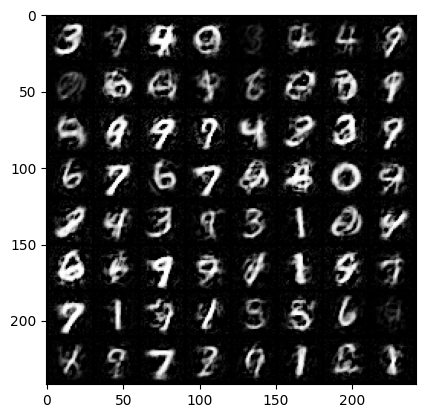

Epoch [47/80] Batch 0/938                   Loss D: 0.0012, Loss G: -0.1552
Epoch [47/80] Batch 100/938                   Loss D: 0.0822, Loss G: -0.3640
Epoch [47/80] Batch 200/938                   Loss D: -0.0034, Loss G: -0.3686
Epoch [47/80] Batch 300/938                   Loss D: -0.0662, Loss G: -0.1147
Epoch [47/80] Batch 400/938                   Loss D: -0.0176, Loss G: -0.5443
Epoch [47/80] Batch 500/938                   Loss D: -0.1219, Loss G: 0.3007
Epoch [47/80] Batch 600/938                   Loss D: 0.0671, Loss G: -0.3880
Epoch [47/80] Batch 700/938                   Loss D: -0.1039, Loss G: 0.1142
Epoch [47/80] Batch 800/938                   Loss D: -0.1202, Loss G: 0.3967
Epoch [47/80] Batch 900/938                   Loss D: -0.0352, Loss G: 0.2354


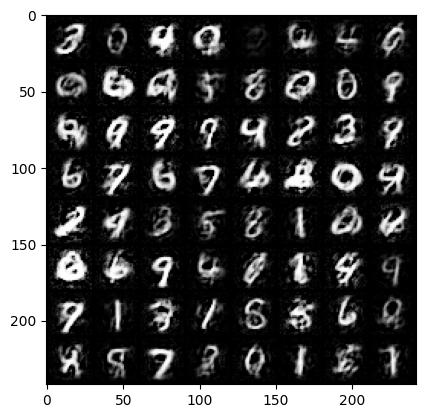

Epoch [48/80] Batch 0/938                   Loss D: 0.0291, Loss G: 0.1364
Epoch [48/80] Batch 100/938                   Loss D: -0.0693, Loss G: 0.3306
Epoch [48/80] Batch 200/938                   Loss D: -0.0441, Loss G: 0.0940
Epoch [48/80] Batch 300/938                   Loss D: -0.0848, Loss G: 0.4939
Epoch [48/80] Batch 400/938                   Loss D: -0.0603, Loss G: 0.0461
Epoch [48/80] Batch 500/938                   Loss D: -0.0394, Loss G: 0.0326
Epoch [48/80] Batch 600/938                   Loss D: 0.0030, Loss G: -0.2121
Epoch [48/80] Batch 700/938                   Loss D: 0.0889, Loss G: -0.0861
Epoch [48/80] Batch 800/938                   Loss D: -0.0758, Loss G: 0.2739
Epoch [48/80] Batch 900/938                   Loss D: 0.0012, Loss G: -0.2207


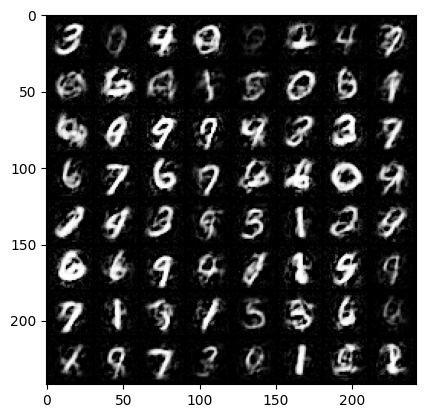

Epoch [49/80] Batch 0/938                   Loss D: -0.1087, Loss G: -0.0655
Epoch [49/80] Batch 100/938                   Loss D: 0.0309, Loss G: 0.0259
Epoch [49/80] Batch 200/938                   Loss D: 0.0572, Loss G: -0.2256
Epoch [49/80] Batch 300/938                   Loss D: 0.0585, Loss G: -0.0629
Epoch [49/80] Batch 400/938                   Loss D: 0.0495, Loss G: -0.0673
Epoch [49/80] Batch 500/938                   Loss D: 0.0591, Loss G: 0.3288
Epoch [49/80] Batch 600/938                   Loss D: -0.0349, Loss G: 0.3278
Epoch [49/80] Batch 700/938                   Loss D: 0.0125, Loss G: -0.3238
Epoch [49/80] Batch 800/938                   Loss D: -0.0797, Loss G: 0.2154
Epoch [49/80] Batch 900/938                   Loss D: -0.1271, Loss G: 0.2091


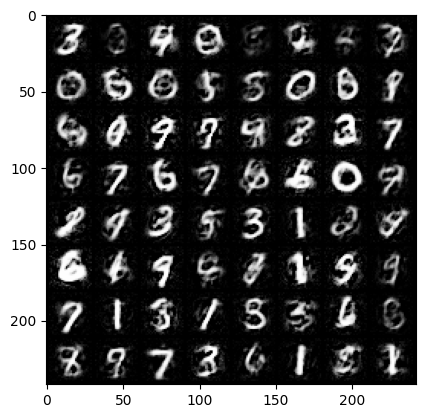

Epoch [50/80] Batch 0/938                   Loss D: -0.0717, Loss G: 0.4424
Epoch [50/80] Batch 100/938                   Loss D: -0.0793, Loss G: 0.0658
Epoch [50/80] Batch 200/938                   Loss D: -0.0916, Loss G: -0.0049
Epoch [50/80] Batch 300/938                   Loss D: -0.0145, Loss G: 0.1633
Epoch [50/80] Batch 400/938                   Loss D: 0.0232, Loss G: -0.0583
Epoch [50/80] Batch 500/938                   Loss D: -0.0832, Loss G: 0.1597
Epoch [50/80] Batch 600/938                   Loss D: -0.0504, Loss G: 0.2896
Epoch [50/80] Batch 700/938                   Loss D: 0.0025, Loss G: -0.1374
Epoch [50/80] Batch 800/938                   Loss D: -0.0521, Loss G: -0.2987
Epoch [50/80] Batch 900/938                   Loss D: 0.0380, Loss G: 0.1703


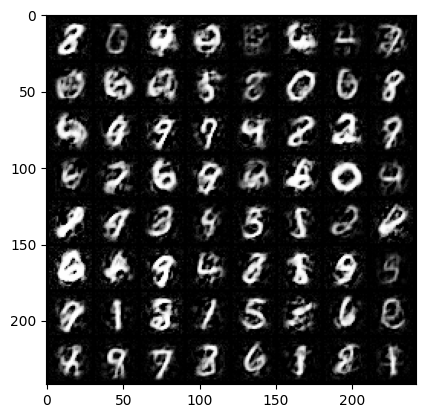

Epoch [51/80] Batch 0/938                   Loss D: 0.1668, Loss G: -0.2625
Epoch [51/80] Batch 100/938                   Loss D: 0.1102, Loss G: 0.1719
Epoch [51/80] Batch 200/938                   Loss D: -0.0381, Loss G: -0.0046
Epoch [51/80] Batch 300/938                   Loss D: -0.0391, Loss G: 0.1054
Epoch [51/80] Batch 400/938                   Loss D: -0.1349, Loss G: 0.3592
Epoch [51/80] Batch 500/938                   Loss D: -0.1242, Loss G: 0.0695
Epoch [51/80] Batch 600/938                   Loss D: 0.0056, Loss G: -0.1759
Epoch [51/80] Batch 700/938                   Loss D: 0.0130, Loss G: 0.2516
Epoch [51/80] Batch 800/938                   Loss D: -0.0036, Loss G: 0.1296
Epoch [51/80] Batch 900/938                   Loss D: -0.0828, Loss G: 0.2523


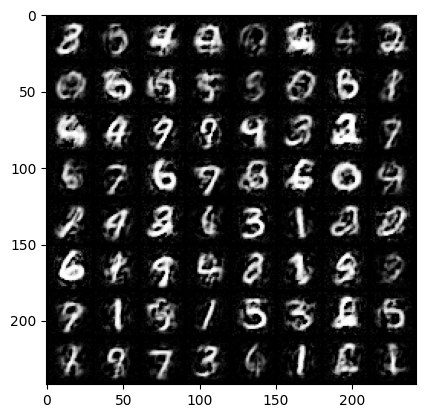

Epoch [52/80] Batch 0/938                   Loss D: -0.0182, Loss G: -0.0582
Epoch [52/80] Batch 100/938                   Loss D: 0.0099, Loss G: -0.0623
Epoch [52/80] Batch 200/938                   Loss D: -0.0369, Loss G: 0.1617
Epoch [52/80] Batch 300/938                   Loss D: -0.0148, Loss G: -0.1801
Epoch [52/80] Batch 400/938                   Loss D: -0.1320, Loss G: 0.3354
Epoch [52/80] Batch 500/938                   Loss D: -0.0304, Loss G: 0.1607
Epoch [52/80] Batch 600/938                   Loss D: -0.0869, Loss G: -0.1945
Epoch [52/80] Batch 700/938                   Loss D: 0.0224, Loss G: 0.1982
Epoch [52/80] Batch 800/938                   Loss D: -0.0096, Loss G: 0.3448
Epoch [52/80] Batch 900/938                   Loss D: -0.0402, Loss G: -0.1058


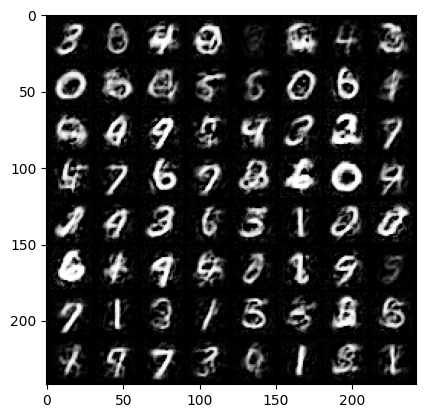

Epoch [53/80] Batch 0/938                   Loss D: 0.0164, Loss G: -0.4201
Epoch [53/80] Batch 100/938                   Loss D: -0.0101, Loss G: 0.0611
Epoch [53/80] Batch 200/938                   Loss D: 0.0611, Loss G: -0.2585
Epoch [53/80] Batch 300/938                   Loss D: 0.0955, Loss G: 0.2218
Epoch [53/80] Batch 400/938                   Loss D: -0.1482, Loss G: 0.5623
Epoch [53/80] Batch 500/938                   Loss D: 0.0098, Loss G: 0.4030
Epoch [53/80] Batch 600/938                   Loss D: -0.0563, Loss G: 0.2084
Epoch [53/80] Batch 700/938                   Loss D: -0.0724, Loss G: 0.3519
Epoch [53/80] Batch 800/938                   Loss D: -0.0839, Loss G: 0.0695
Epoch [53/80] Batch 900/938                   Loss D: -0.0240, Loss G: 0.0441


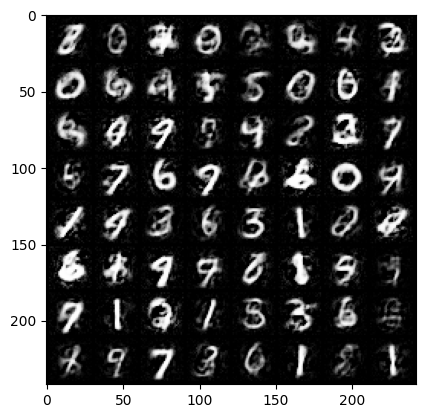

Epoch [54/80] Batch 0/938                   Loss D: -0.0472, Loss G: 0.0571
Epoch [54/80] Batch 100/938                   Loss D: -0.1441, Loss G: 0.2120
Epoch [54/80] Batch 200/938                   Loss D: -0.0812, Loss G: 0.2387
Epoch [54/80] Batch 300/938                   Loss D: -0.0075, Loss G: -0.1569
Epoch [54/80] Batch 400/938                   Loss D: -0.0258, Loss G: -0.2980
Epoch [54/80] Batch 500/938                   Loss D: -0.0001, Loss G: 0.1263
Epoch [54/80] Batch 600/938                   Loss D: 0.0131, Loss G: -0.3616
Epoch [54/80] Batch 700/938                   Loss D: 0.0286, Loss G: -0.0231
Epoch [54/80] Batch 800/938                   Loss D: 0.0142, Loss G: -0.3064
Epoch [54/80] Batch 900/938                   Loss D: 0.0190, Loss G: 0.0729


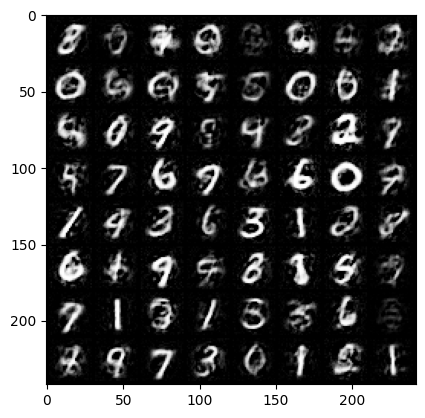

Epoch [55/80] Batch 0/938                   Loss D: 0.0527, Loss G: -0.0900
Epoch [55/80] Batch 100/938                   Loss D: -0.0896, Loss G: 0.2717
Epoch [55/80] Batch 200/938                   Loss D: -0.0101, Loss G: -0.2573
Epoch [55/80] Batch 300/938                   Loss D: -0.0473, Loss G: 0.2780
Epoch [55/80] Batch 400/938                   Loss D: 0.0102, Loss G: 0.2157
Epoch [55/80] Batch 500/938                   Loss D: 0.0359, Loss G: 0.2798
Epoch [55/80] Batch 600/938                   Loss D: 0.0133, Loss G: -0.3359
Epoch [55/80] Batch 700/938                   Loss D: -0.0470, Loss G: -0.0650
Epoch [55/80] Batch 800/938                   Loss D: -0.0538, Loss G: 0.3998
Epoch [55/80] Batch 900/938                   Loss D: -0.0038, Loss G: -0.0603


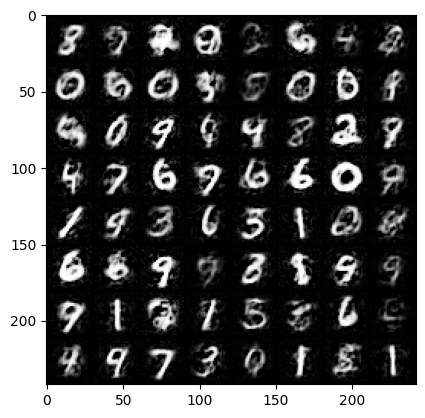

Epoch [56/80] Batch 0/938                   Loss D: 0.0285, Loss G: -0.3373
Epoch [56/80] Batch 100/938                   Loss D: 0.0321, Loss G: 0.0321
Epoch [56/80] Batch 200/938                   Loss D: 0.0966, Loss G: -0.0787
Epoch [56/80] Batch 300/938                   Loss D: -0.0335, Loss G: 0.2978
Epoch [56/80] Batch 400/938                   Loss D: -0.0425, Loss G: 0.2943
Epoch [56/80] Batch 500/938                   Loss D: 0.0029, Loss G: -0.3384
Epoch [56/80] Batch 600/938                   Loss D: 0.0474, Loss G: -0.3162
Epoch [56/80] Batch 700/938                   Loss D: -0.0701, Loss G: 0.0273
Epoch [56/80] Batch 800/938                   Loss D: 0.0024, Loss G: -0.1204
Epoch [56/80] Batch 900/938                   Loss D: 0.0202, Loss G: -0.2952


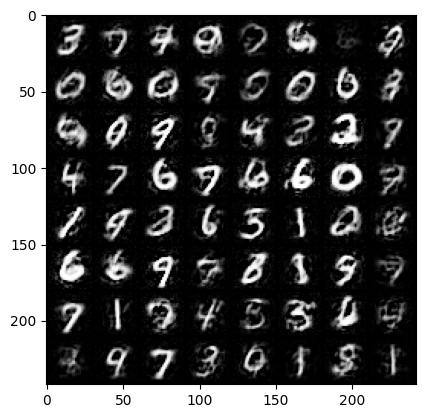

Epoch [57/80] Batch 0/938                   Loss D: 0.0256, Loss G: -0.0229
Epoch [57/80] Batch 100/938                   Loss D: -0.0018, Loss G: -0.1981
Epoch [57/80] Batch 200/938                   Loss D: 0.0214, Loss G: 0.0492
Epoch [57/80] Batch 300/938                   Loss D: 0.0066, Loss G: -0.0839
Epoch [57/80] Batch 400/938                   Loss D: -0.0759, Loss G: 0.0222
Epoch [57/80] Batch 500/938                   Loss D: 0.0276, Loss G: 0.0670
Epoch [57/80] Batch 600/938                   Loss D: -0.0278, Loss G: 0.1914
Epoch [57/80] Batch 700/938                   Loss D: 0.0537, Loss G: -0.1615
Epoch [57/80] Batch 800/938                   Loss D: -0.0065, Loss G: 0.1447
Epoch [57/80] Batch 900/938                   Loss D: 0.0280, Loss G: 0.0956


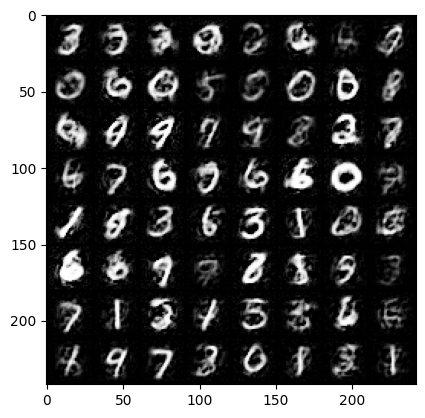

Epoch [58/80] Batch 0/938                   Loss D: -0.0596, Loss G: 0.1308
Epoch [58/80] Batch 100/938                   Loss D: 0.0103, Loss G: 0.0026
Epoch [58/80] Batch 200/938                   Loss D: 0.0302, Loss G: -0.1792
Epoch [58/80] Batch 300/938                   Loss D: 0.0251, Loss G: -0.1868
Epoch [58/80] Batch 400/938                   Loss D: 0.0200, Loss G: -0.1414
Epoch [58/80] Batch 500/938                   Loss D: -0.0190, Loss G: -0.1694
Epoch [58/80] Batch 600/938                   Loss D: -0.0191, Loss G: 0.1341
Epoch [58/80] Batch 700/938                   Loss D: -0.0205, Loss G: 0.0926
Epoch [58/80] Batch 800/938                   Loss D: -0.0885, Loss G: 0.2594
Epoch [58/80] Batch 900/938                   Loss D: -0.1505, Loss G: 0.2022


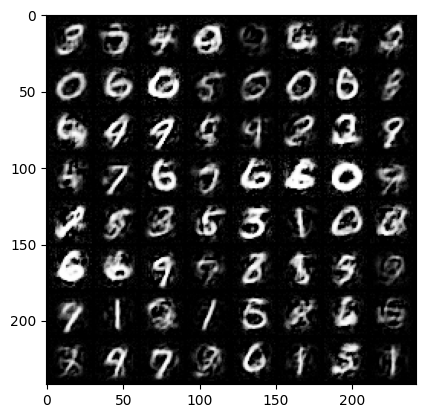

Epoch [59/80] Batch 0/938                   Loss D: 0.1337, Loss G: 0.0354
Epoch [59/80] Batch 100/938                   Loss D: -0.0043, Loss G: -0.2960
Epoch [59/80] Batch 200/938                   Loss D: -0.0289, Loss G: -0.1104
Epoch [59/80] Batch 300/938                   Loss D: -0.0167, Loss G: 0.2044
Epoch [59/80] Batch 400/938                   Loss D: 0.0312, Loss G: -0.1195
Epoch [59/80] Batch 500/938                   Loss D: 0.0202, Loss G: -0.2772
Epoch [59/80] Batch 600/938                   Loss D: -0.0046, Loss G: 0.0030
Epoch [59/80] Batch 700/938                   Loss D: 0.0605, Loss G: -0.0710
Epoch [59/80] Batch 800/938                   Loss D: -0.0489, Loss G: 0.2456
Epoch [59/80] Batch 900/938                   Loss D: 0.0097, Loss G: -0.0791


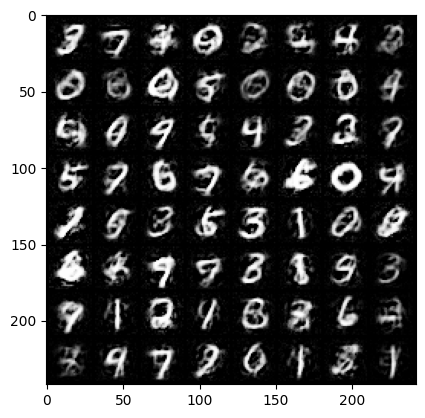

Epoch [60/80] Batch 0/938                   Loss D: -0.0156, Loss G: 0.2130
Epoch [60/80] Batch 100/938                   Loss D: -0.0466, Loss G: -0.2147
Epoch [60/80] Batch 200/938                   Loss D: -0.0130, Loss G: 0.2187
Epoch [60/80] Batch 300/938                   Loss D: -0.0621, Loss G: -0.0058
Epoch [60/80] Batch 400/938                   Loss D: -0.0466, Loss G: 0.0704
Epoch [60/80] Batch 500/938                   Loss D: -0.0492, Loss G: 0.1235
Epoch [60/80] Batch 600/938                   Loss D: -0.0434, Loss G: -0.2175
Epoch [60/80] Batch 700/938                   Loss D: -0.0886, Loss G: 0.1939
Epoch [60/80] Batch 800/938                   Loss D: -0.0295, Loss G: -0.0037
Epoch [60/80] Batch 900/938                   Loss D: 0.0227, Loss G: -0.2137


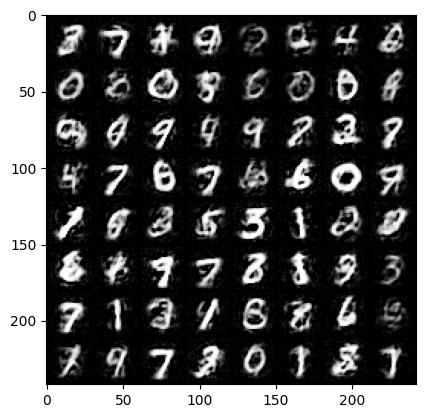

Epoch [61/80] Batch 0/938                   Loss D: 0.0164, Loss G: -0.0252
Epoch [61/80] Batch 100/938                   Loss D: -0.0343, Loss G: -0.1272
Epoch [61/80] Batch 200/938                   Loss D: 0.0001, Loss G: -0.3735
Epoch [61/80] Batch 300/938                   Loss D: 0.0184, Loss G: -0.2213
Epoch [61/80] Batch 400/938                   Loss D: -0.0445, Loss G: 0.0310
Epoch [61/80] Batch 500/938                   Loss D: 0.0285, Loss G: 0.1211
Epoch [61/80] Batch 600/938                   Loss D: 0.0425, Loss G: -0.2594
Epoch [61/80] Batch 700/938                   Loss D: 0.0710, Loss G: -0.3154
Epoch [61/80] Batch 800/938                   Loss D: 0.0002, Loss G: -0.0292
Epoch [61/80] Batch 900/938                   Loss D: 0.0583, Loss G: 0.0355


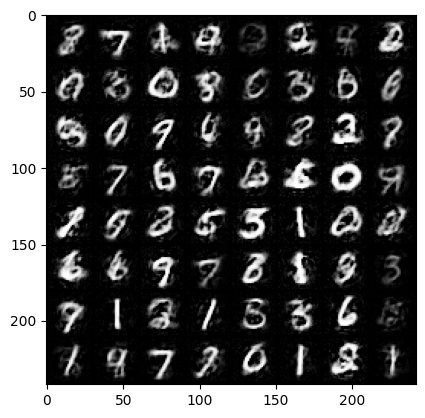

Epoch [62/80] Batch 0/938                   Loss D: 0.0111, Loss G: -0.1950
Epoch [62/80] Batch 100/938                   Loss D: 0.0562, Loss G: -0.0714
Epoch [62/80] Batch 200/938                   Loss D: 0.0397, Loss G: -0.1279
Epoch [62/80] Batch 300/938                   Loss D: -0.0053, Loss G: -0.0917
Epoch [62/80] Batch 400/938                   Loss D: 0.0096, Loss G: -0.1705
Epoch [62/80] Batch 500/938                   Loss D: -0.0007, Loss G: 0.0272
Epoch [62/80] Batch 600/938                   Loss D: 0.0617, Loss G: -0.1580
Epoch [62/80] Batch 700/938                   Loss D: -0.0101, Loss G: -0.0236
Epoch [62/80] Batch 800/938                   Loss D: 0.0075, Loss G: 0.0575
Epoch [62/80] Batch 900/938                   Loss D: 0.0395, Loss G: -0.1556


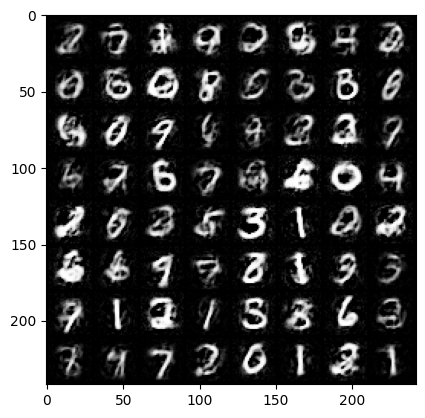

Epoch [63/80] Batch 0/938                   Loss D: 0.0353, Loss G: 0.0372
Epoch [63/80] Batch 100/938                   Loss D: 0.0132, Loss G: -0.0435
Epoch [63/80] Batch 200/938                   Loss D: 0.0045, Loss G: 0.0562
Epoch [63/80] Batch 300/938                   Loss D: -0.0086, Loss G: -0.0071
Epoch [63/80] Batch 400/938                   Loss D: 0.0243, Loss G: 0.0255
Epoch [63/80] Batch 500/938                   Loss D: -0.0432, Loss G: 0.1884
Epoch [63/80] Batch 600/938                   Loss D: 0.0237, Loss G: -0.1800
Epoch [63/80] Batch 700/938                   Loss D: -0.0108, Loss G: 0.0155
Epoch [63/80] Batch 800/938                   Loss D: -0.0116, Loss G: -0.1597
Epoch [63/80] Batch 900/938                   Loss D: -0.0080, Loss G: 0.0656


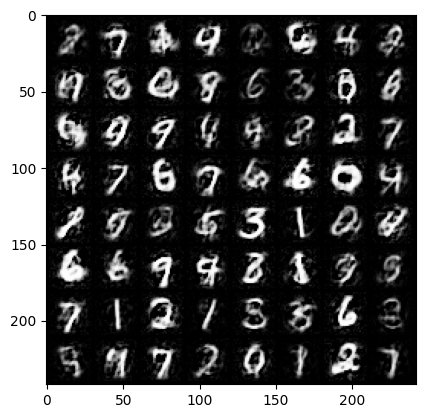

Epoch [64/80] Batch 0/938                   Loss D: 0.0035, Loss G: -0.0632
Epoch [64/80] Batch 100/938                   Loss D: 0.0087, Loss G: -0.0277
Epoch [64/80] Batch 200/938                   Loss D: -0.0271, Loss G: -0.0257
Epoch [64/80] Batch 300/938                   Loss D: 0.0111, Loss G: -0.0870
Epoch [64/80] Batch 400/938                   Loss D: -0.0086, Loss G: -0.1107
Epoch [64/80] Batch 500/938                   Loss D: -0.0275, Loss G: 0.0198
Epoch [64/80] Batch 600/938                   Loss D: -0.0485, Loss G: 0.0984
Epoch [64/80] Batch 700/938                   Loss D: 0.0451, Loss G: -0.1940
Epoch [64/80] Batch 800/938                   Loss D: 0.0466, Loss G: 0.0684
Epoch [64/80] Batch 900/938                   Loss D: 0.0321, Loss G: -0.0139


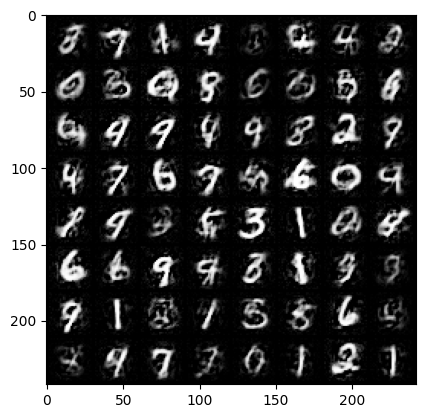

Epoch [65/80] Batch 0/938                   Loss D: 0.0262, Loss G: 0.0684
Epoch [65/80] Batch 100/938                   Loss D: 0.0236, Loss G: -0.0080
Epoch [65/80] Batch 200/938                   Loss D: -0.0095, Loss G: -0.0021
Epoch [65/80] Batch 300/938                   Loss D: -0.0327, Loss G: 0.1470
Epoch [65/80] Batch 400/938                   Loss D: -0.0345, Loss G: -0.1094
Epoch [65/80] Batch 500/938                   Loss D: 0.0102, Loss G: -0.0918
Epoch [65/80] Batch 600/938                   Loss D: 0.0123, Loss G: -0.0817
Epoch [65/80] Batch 700/938                   Loss D: 0.0010, Loss G: 0.0420
Epoch [65/80] Batch 800/938                   Loss D: -0.0136, Loss G: -0.0304
Epoch [65/80] Batch 900/938                   Loss D: -0.0152, Loss G: -0.0050


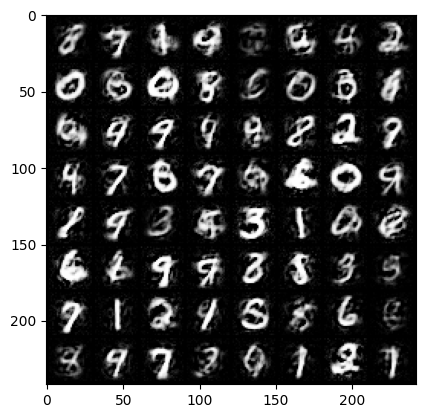

Epoch [66/80] Batch 0/938                   Loss D: 0.0018, Loss G: 0.0202
Epoch [66/80] Batch 100/938                   Loss D: 0.0104, Loss G: -0.0512
Epoch [66/80] Batch 200/938                   Loss D: -0.0165, Loss G: 0.0281
Epoch [66/80] Batch 300/938                   Loss D: -0.0085, Loss G: 0.0525
Epoch [66/80] Batch 400/938                   Loss D: 0.0158, Loss G: 0.0714
Epoch [66/80] Batch 500/938                   Loss D: -0.0158, Loss G: -0.0068
Epoch [66/80] Batch 600/938                   Loss D: 0.0105, Loss G: -0.0051
Epoch [66/80] Batch 700/938                   Loss D: -0.0190, Loss G: -0.0479
Epoch [66/80] Batch 800/938                   Loss D: 0.0230, Loss G: -0.0065
Epoch [66/80] Batch 900/938                   Loss D: 0.0302, Loss G: -0.1609


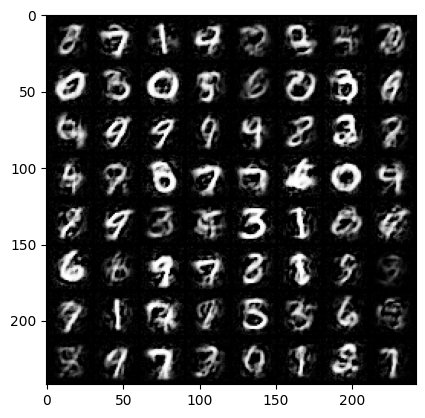

Epoch [67/80] Batch 0/938                   Loss D: -0.0033, Loss G: -0.0662
Epoch [67/80] Batch 100/938                   Loss D: -0.0184, Loss G: -0.0981
Epoch [67/80] Batch 200/938                   Loss D: -0.0076, Loss G: -0.0183
Epoch [67/80] Batch 300/938                   Loss D: -0.0264, Loss G: 0.0744
Epoch [67/80] Batch 400/938                   Loss D: -0.0241, Loss G: -0.0478
Epoch [67/80] Batch 500/938                   Loss D: 0.0324, Loss G: -0.0149
Epoch [67/80] Batch 600/938                   Loss D: 0.0224, Loss G: 0.0761
Epoch [67/80] Batch 700/938                   Loss D: -0.0111, Loss G: -0.0007
Epoch [67/80] Batch 800/938                   Loss D: -0.0004, Loss G: -0.0641
Epoch [67/80] Batch 900/938                   Loss D: 0.0609, Loss G: -0.0308


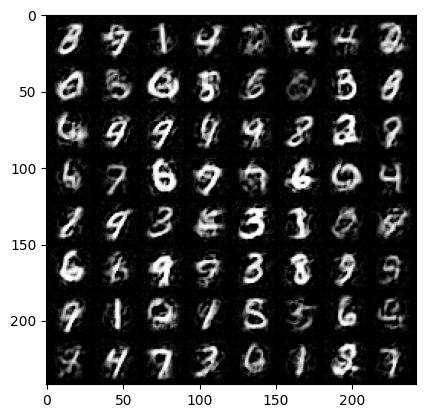

Epoch [68/80] Batch 0/938                   Loss D: 0.0261, Loss G: -0.0932
Epoch [68/80] Batch 100/938                   Loss D: 0.0127, Loss G: 0.0459
Epoch [68/80] Batch 200/938                   Loss D: -0.0129, Loss G: 0.0194
Epoch [68/80] Batch 300/938                   Loss D: -0.0218, Loss G: -0.0025
Epoch [68/80] Batch 400/938                   Loss D: 0.0102, Loss G: 0.0074
Epoch [68/80] Batch 500/938                   Loss D: 0.0356, Loss G: -0.0427
Epoch [68/80] Batch 600/938                   Loss D: 0.0086, Loss G: 0.0302
Epoch [68/80] Batch 700/938                   Loss D: -0.0088, Loss G: 0.0132
Epoch [68/80] Batch 800/938                   Loss D: -0.0042, Loss G: -0.0005
Epoch [68/80] Batch 900/938                   Loss D: 0.0041, Loss G: -0.0298


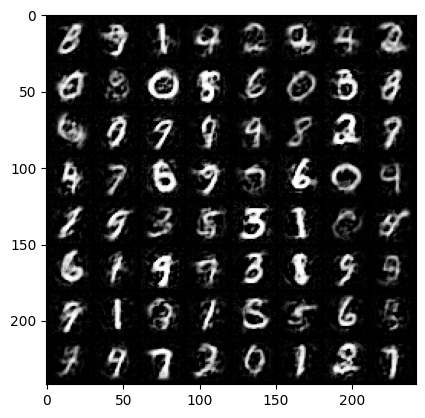

Epoch [69/80] Batch 0/938                   Loss D: -0.0033, Loss G: -0.0083
Epoch [69/80] Batch 100/938                   Loss D: -0.0160, Loss G: -0.0318
Epoch [69/80] Batch 200/938                   Loss D: -0.0076, Loss G: -0.0096
Epoch [69/80] Batch 300/938                   Loss D: 0.0112, Loss G: -0.0118
Epoch [69/80] Batch 400/938                   Loss D: 0.0028, Loss G: 0.0009
Epoch [69/80] Batch 500/938                   Loss D: 0.0076, Loss G: 0.0417
Epoch [69/80] Batch 600/938                   Loss D: -0.0094, Loss G: 0.0434
Epoch [69/80] Batch 700/938                   Loss D: 0.0036, Loss G: 0.0421
Epoch [69/80] Batch 800/938                   Loss D: -0.0093, Loss G: 0.0169
Epoch [69/80] Batch 900/938                   Loss D: 0.0150, Loss G: -0.0012


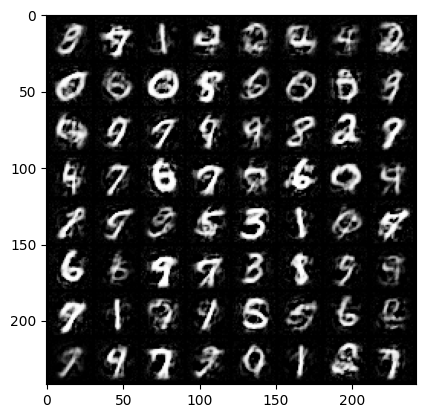

Epoch [70/80] Batch 0/938                   Loss D: -0.0028, Loss G: 0.0155
Epoch [70/80] Batch 100/938                   Loss D: 0.0535, Loss G: -0.0452
Epoch [70/80] Batch 200/938                   Loss D: -0.0025, Loss G: 0.0005
Epoch [70/80] Batch 300/938                   Loss D: -0.0056, Loss G: 0.0414
Epoch [70/80] Batch 400/938                   Loss D: -0.0020, Loss G: -0.0298
Epoch [70/80] Batch 500/938                   Loss D: 0.0007, Loss G: -0.0062
Epoch [70/80] Batch 600/938                   Loss D: -0.0057, Loss G: -0.0283
Epoch [70/80] Batch 700/938                   Loss D: -0.0049, Loss G: -0.0229
Epoch [70/80] Batch 800/938                   Loss D: -0.0015, Loss G: 0.0250
Epoch [70/80] Batch 900/938                   Loss D: -0.0172, Loss G: 0.0626


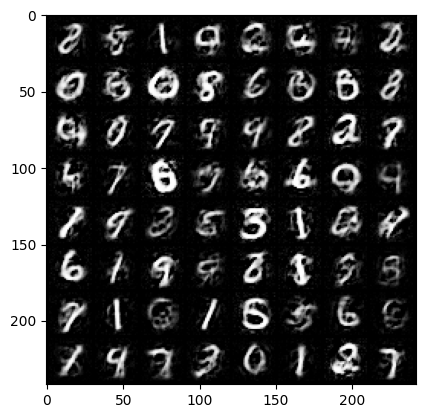

Epoch [71/80] Batch 0/938                   Loss D: -0.0042, Loss G: -0.0199
Epoch [71/80] Batch 100/938                   Loss D: -0.0039, Loss G: 0.0126
Epoch [71/80] Batch 200/938                   Loss D: 0.0005, Loss G: -0.0138
Epoch [71/80] Batch 300/938                   Loss D: -0.0064, Loss G: 0.0239
Epoch [71/80] Batch 400/938                   Loss D: 0.0020, Loss G: 0.0070
Epoch [71/80] Batch 500/938                   Loss D: -0.0096, Loss G: 0.0095
Epoch [71/80] Batch 600/938                   Loss D: -0.0044, Loss G: 0.0116
Epoch [71/80] Batch 700/938                   Loss D: -0.0004, Loss G: 0.0239
Epoch [71/80] Batch 800/938                   Loss D: -0.0140, Loss G: 0.0134
Epoch [71/80] Batch 900/938                   Loss D: 0.0031, Loss G: -0.0059


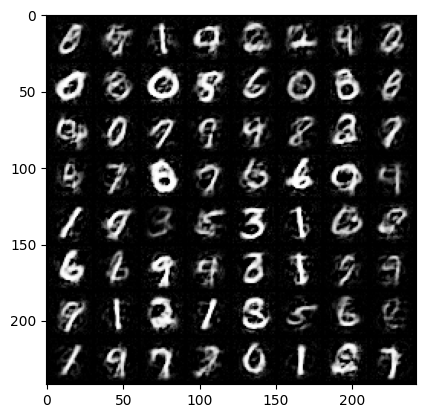

Epoch [72/80] Batch 0/938                   Loss D: 0.0003, Loss G: 0.0050
Epoch [72/80] Batch 100/938                   Loss D: -0.0049, Loss G: 0.0150
Epoch [72/80] Batch 200/938                   Loss D: 0.0000, Loss G: 0.0406
Epoch [72/80] Batch 300/938                   Loss D: 0.0136, Loss G: -0.0117
Epoch [72/80] Batch 400/938                   Loss D: -0.0060, Loss G: -0.0030
Epoch [72/80] Batch 500/938                   Loss D: -0.0019, Loss G: 0.0103
Epoch [72/80] Batch 600/938                   Loss D: -0.0003, Loss G: -0.0055
Epoch [72/80] Batch 700/938                   Loss D: 0.0088, Loss G: 0.0031
Epoch [72/80] Batch 800/938                   Loss D: -0.0082, Loss G: 0.0054
Epoch [72/80] Batch 900/938                   Loss D: -0.0065, Loss G: -0.0190


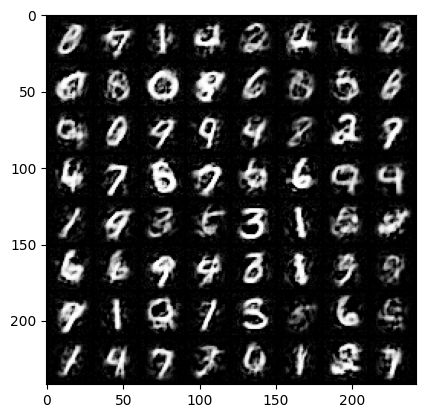

Epoch [73/80] Batch 0/938                   Loss D: -0.0065, Loss G: -0.0157
Epoch [73/80] Batch 100/938                   Loss D: -0.0030, Loss G: -0.0128
Epoch [73/80] Batch 200/938                   Loss D: 0.0041, Loss G: 0.0104
Epoch [73/80] Batch 300/938                   Loss D: 0.0186, Loss G: -0.0342
Epoch [73/80] Batch 400/938                   Loss D: 0.0081, Loss G: 0.0316
Epoch [73/80] Batch 500/938                   Loss D: 0.0036, Loss G: -0.0001
Epoch [73/80] Batch 600/938                   Loss D: -0.0115, Loss G: 0.0304
Epoch [73/80] Batch 700/938                   Loss D: -0.0091, Loss G: 0.0109
Epoch [73/80] Batch 800/938                   Loss D: 0.0031, Loss G: 0.0064
Epoch [73/80] Batch 900/938                   Loss D: -0.0053, Loss G: -0.0023


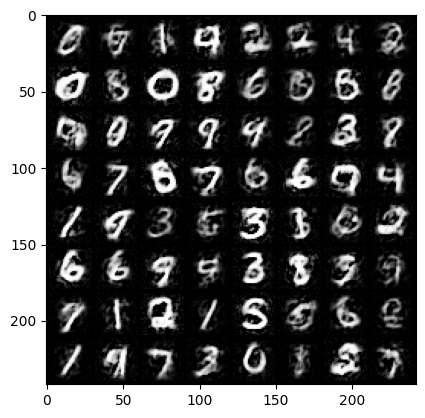

Epoch [74/80] Batch 0/938                   Loss D: -0.0047, Loss G: -0.0096
Epoch [74/80] Batch 100/938                   Loss D: -0.0026, Loss G: -0.0056
Epoch [74/80] Batch 200/938                   Loss D: -0.0020, Loss G: -0.0039
Epoch [74/80] Batch 300/938                   Loss D: -0.0022, Loss G: 0.0062
Epoch [74/80] Batch 400/938                   Loss D: -0.0007, Loss G: -0.0040
Epoch [74/80] Batch 500/938                   Loss D: -0.0021, Loss G: 0.0254
Epoch [74/80] Batch 600/938                   Loss D: -0.0088, Loss G: -0.0092
Epoch [74/80] Batch 700/938                   Loss D: -0.0084, Loss G: -0.0150
Epoch [74/80] Batch 800/938                   Loss D: 0.0010, Loss G: -0.0154
Epoch [74/80] Batch 900/938                   Loss D: -0.0036, Loss G: -0.0057


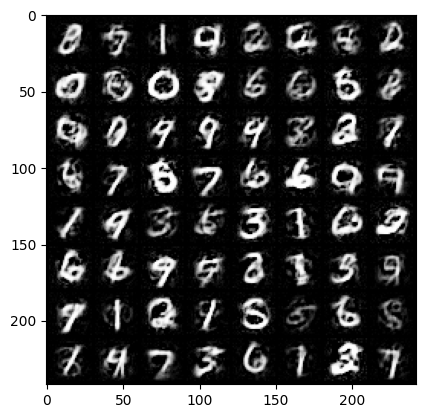

Epoch [75/80] Batch 0/938                   Loss D: -0.0005, Loss G: 0.0007
Epoch [75/80] Batch 100/938                   Loss D: 0.0094, Loss G: 0.0077
Epoch [75/80] Batch 200/938                   Loss D: -0.0057, Loss G: 0.0154
Epoch [75/80] Batch 300/938                   Loss D: -0.0032, Loss G: 0.0290
Epoch [75/80] Batch 400/938                   Loss D: -0.0052, Loss G: 0.0090
Epoch [75/80] Batch 500/938                   Loss D: 0.0022, Loss G: 0.0102
Epoch [75/80] Batch 600/938                   Loss D: 0.0111, Loss G: -0.0052
Epoch [75/80] Batch 700/938                   Loss D: -0.0054, Loss G: 0.0272
Epoch [75/80] Batch 800/938                   Loss D: 0.0018, Loss G: 0.0176
Epoch [75/80] Batch 900/938                   Loss D: 0.0000, Loss G: 0.0342


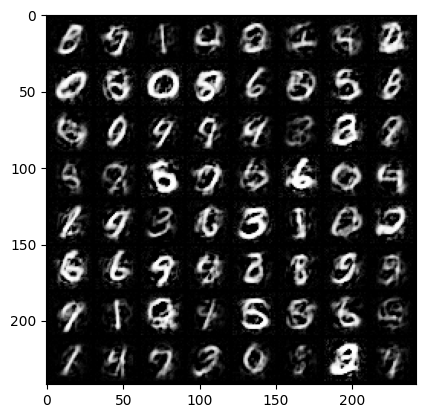

Epoch [76/80] Batch 0/938                   Loss D: 0.0084, Loss G: 0.0096
Epoch [76/80] Batch 100/938                   Loss D: -0.0055, Loss G: 0.0252
Epoch [76/80] Batch 200/938                   Loss D: 0.0002, Loss G: 0.0034
Epoch [76/80] Batch 300/938                   Loss D: 0.0000, Loss G: 0.0067
Epoch [76/80] Batch 400/938                   Loss D: -0.0001, Loss G: -0.0007
Epoch [76/80] Batch 500/938                   Loss D: -0.0010, Loss G: -0.0218
Epoch [76/80] Batch 600/938                   Loss D: -0.0084, Loss G: 0.0155
Epoch [76/80] Batch 700/938                   Loss D: -0.0018, Loss G: 0.0107
Epoch [76/80] Batch 800/938                   Loss D: -0.0027, Loss G: 0.0096
Epoch [76/80] Batch 900/938                   Loss D: -0.0005, Loss G: 0.0000


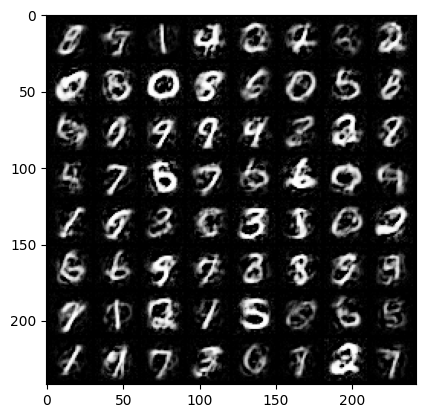

Epoch [77/80] Batch 0/938                   Loss D: -0.0005, Loss G: 0.0306
Epoch [77/80] Batch 100/938                   Loss D: 0.0120, Loss G: 0.0056
Epoch [77/80] Batch 200/938                   Loss D: 0.0066, Loss G: 0.0051
Epoch [77/80] Batch 300/938                   Loss D: 0.0105, Loss G: -0.0030
Epoch [77/80] Batch 400/938                   Loss D: -0.0032, Loss G: 0.0104
Epoch [77/80] Batch 500/938                   Loss D: 0.0022, Loss G: -0.0102
Epoch [77/80] Batch 600/938                   Loss D: 0.0064, Loss G: 0.0143
Epoch [77/80] Batch 700/938                   Loss D: -0.0044, Loss G: 0.0098
Epoch [77/80] Batch 800/938                   Loss D: -0.0042, Loss G: -0.0035
Epoch [77/80] Batch 900/938                   Loss D: -0.0013, Loss G: 0.0148


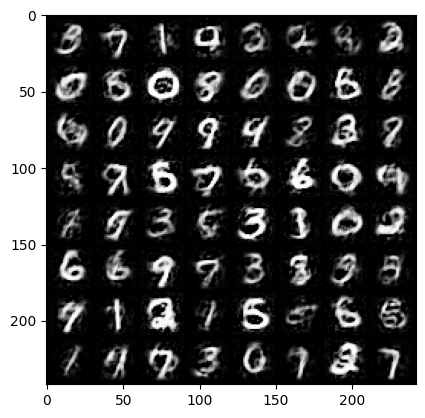

Epoch [78/80] Batch 0/938                   Loss D: 0.0016, Loss G: 0.0067
Epoch [78/80] Batch 100/938                   Loss D: 0.0054, Loss G: -0.0073
Epoch [78/80] Batch 200/938                   Loss D: 0.0007, Loss G: 0.0082
Epoch [78/80] Batch 300/938                   Loss D: 0.0106, Loss G: -0.0328
Epoch [78/80] Batch 400/938                   Loss D: -0.0029, Loss G: 0.0303
Epoch [78/80] Batch 500/938                   Loss D: 0.0031, Loss G: 0.0186
Epoch [78/80] Batch 600/938                   Loss D: -0.0067, Loss G: 0.0106
Epoch [78/80] Batch 700/938                   Loss D: -0.0010, Loss G: 0.0066
Epoch [78/80] Batch 800/938                   Loss D: 0.0008, Loss G: -0.0030
Epoch [78/80] Batch 900/938                   Loss D: 0.0009, Loss G: -0.0216


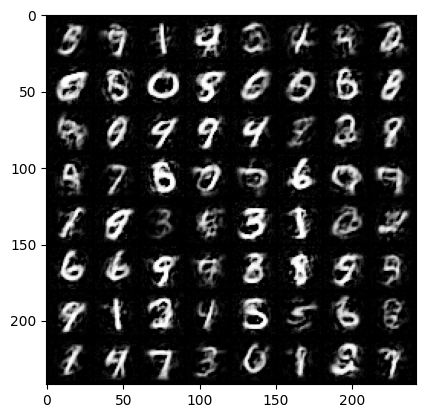

Epoch [79/80] Batch 0/938                   Loss D: 0.0070, Loss G: -0.0060
Epoch [79/80] Batch 100/938                   Loss D: -0.0013, Loss G: -0.0177
Epoch [79/80] Batch 200/938                   Loss D: -0.0023, Loss G: -0.0232
Epoch [79/80] Batch 300/938                   Loss D: 0.0003, Loss G: -0.0075
Epoch [79/80] Batch 400/938                   Loss D: 0.0005, Loss G: -0.0135
Epoch [79/80] Batch 500/938                   Loss D: -0.0010, Loss G: -0.0214
Epoch [79/80] Batch 600/938                   Loss D: -0.0001, Loss G: -0.0040
Epoch [79/80] Batch 700/938                   Loss D: -0.0018, Loss G: -0.0082
Epoch [79/80] Batch 800/938                   Loss D: 0.0029, Loss G: -0.0002
Epoch [79/80] Batch 900/938                   Loss D: -0.0009, Loss G: -0.0020


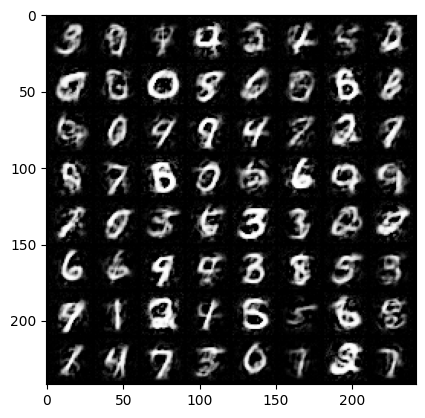

In [9]:
#Setting up the parameter and preparing the data
num_epochs = 80
fixed_noise = torch.randn(64,100)

for epoch in range(num_epochs):
    for i, (data, _) in enumerate(trainloader):
        real_data = data
        batch_size = real_data.size(0)

        # Train the discriminator
        noise = torch.randn(batch_size, 100)
        fake_data = generator(noise)

        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data.detach())

        lossD = discriminator_loss(real_output, fake_output)

        OptimizerD.zero_grad()
        lossD.backward()
        OptimizerD.step()

        # Clamp weights of discriminator to a fixed range for stability
        for p in discriminator.parameters():
            p.data.clamp_(-0.01, 0.01)

        # Train the generator
        fake_output = discriminator(fake_data)
        lossG = generator_loss(fake_output)

        OptimizerG.zero_grad()
        lossG.backward()
        OptimizerG.step()

        if i % 100 == 0:
            print(f'Epoch [{epoch}/{num_epochs}] Batch {i}/{len(trainloader)} \
                  Loss D: {lossD.item():.4f}, Loss G: {lossG.item():.4f}')

    with torch.no_grad():
        fake_images = generator(fixed_noise).detach()
    img_grid = torchvision.utils.make_grid(fake_images)
    np_img = img_grid.numpy()
    plt.imshow(np.transpose(np_img, (1, 2, 0)))
    plt.show()